In [1]:
import numpy as np
from matplotlib import pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

A função abaixo gera datasets independentes para um problema fictício a ser estudado na atividade.

A função apresenta dois parâmetros:

- size: inteiro que escolhe o tamanho do dataset
- controled_x: booleana que escolhe se o input foi controlado na coleta do dataset ou não

In [2]:
def generate_dataset(size: int, controled_x: bool):
    if controled_x:
        x = np.arange(size)/size
    else:
        x = np.random.uniform(size=size)
    y = np.sin(2.5*np.pi*x) + 0.3*np.random.randn(size)
    return x[..., np.newaxis], y

Exemplo de como usar a função para gerar um dataset de 100 amostras em que o input não foi controlado.

Use esse dataset como dataset de teste para os próximos exercícios.

In [77]:
x_test, y_test = generate_dataset(100, False)

# Questão 1

Exercício 1:

a)

Aplique o algoritmo de regressão linear ([LinearRegression](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html#sklearn.linear_model.LinearRegression)) para datasets de tamanhos 5, 10, 15, 20, 25, 30, 35, 40, 45 e 50. Gere esses datasets considerando o caso em que o input é controlado durante a coleta.

Para cada tamanho, gere pelo menos 30 datasets diferentes e treine um modelo para cada dataset.

Mostre com gráficos o que acontece com os seguintes itens relacionados aos modelos treinados (evidenciando média e variância entre os resultados de cada modelos) a medida que o tamanho do dataset aumenta:

- a loss de teste
- o coeficiente angular
- o coeficiente linear

b)

Explique em poucas palavras o comportamento observado nos gráficos apresentados no item anterior.

c)

Os resultados deveriam mudar caso os datasets fossem gerados considerando o caso em que o input não é controlado durante a coleta? Justifique sua resposta.

## **Alternativa A**

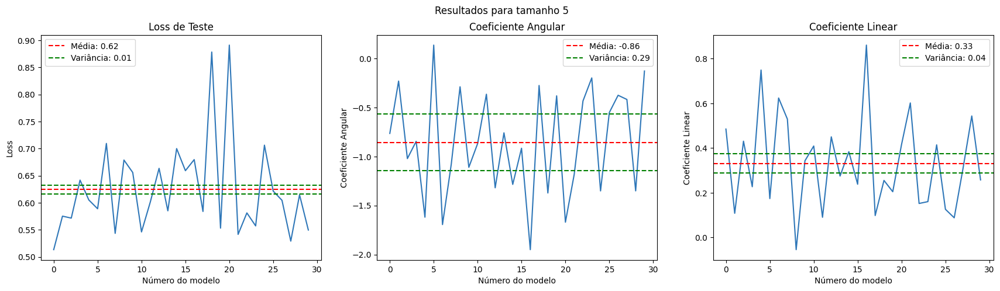

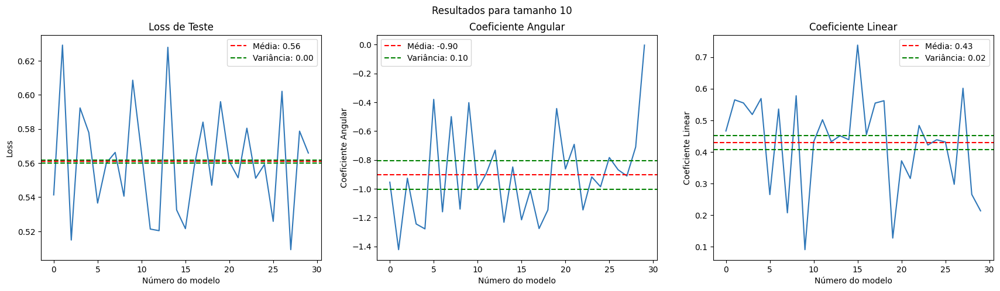

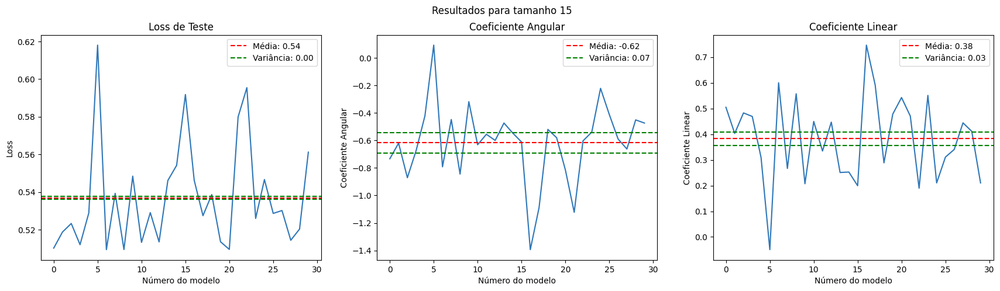

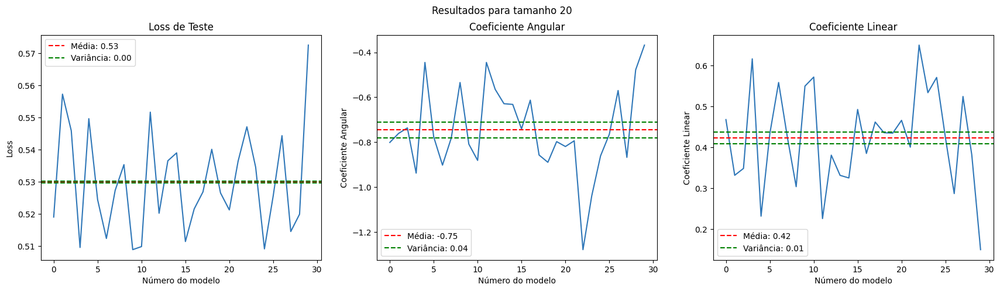

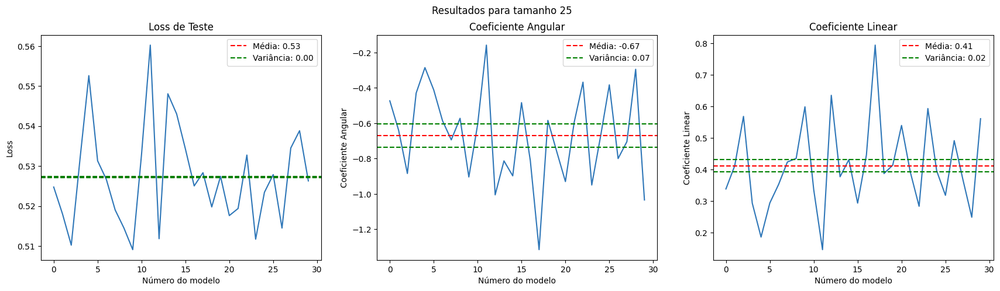

...

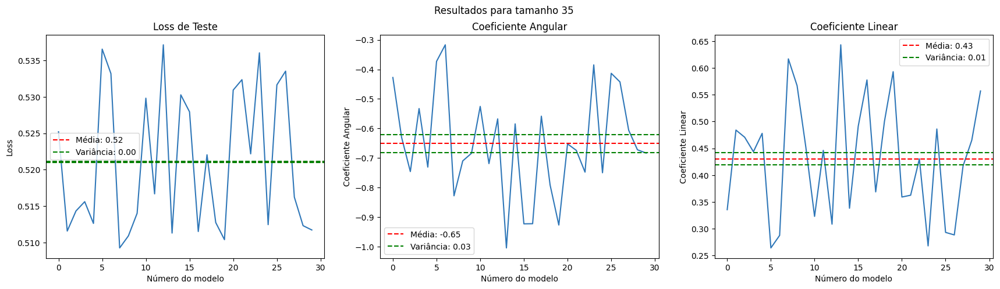

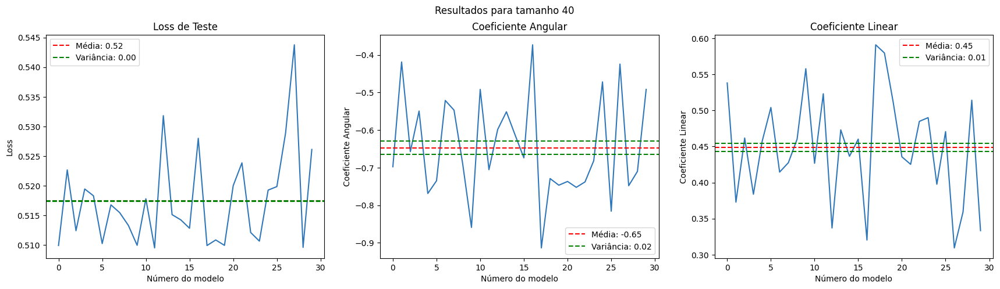

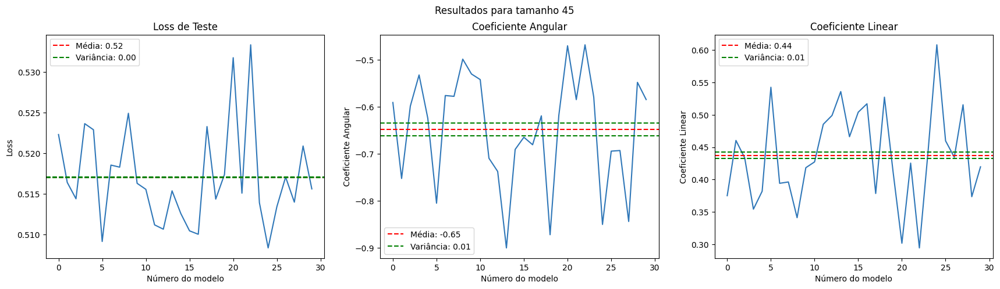

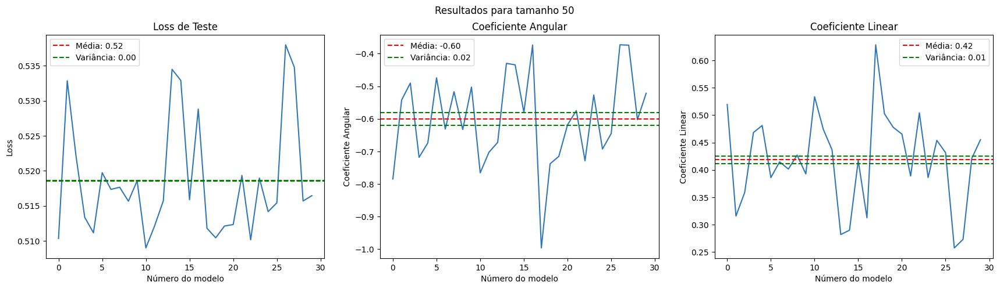

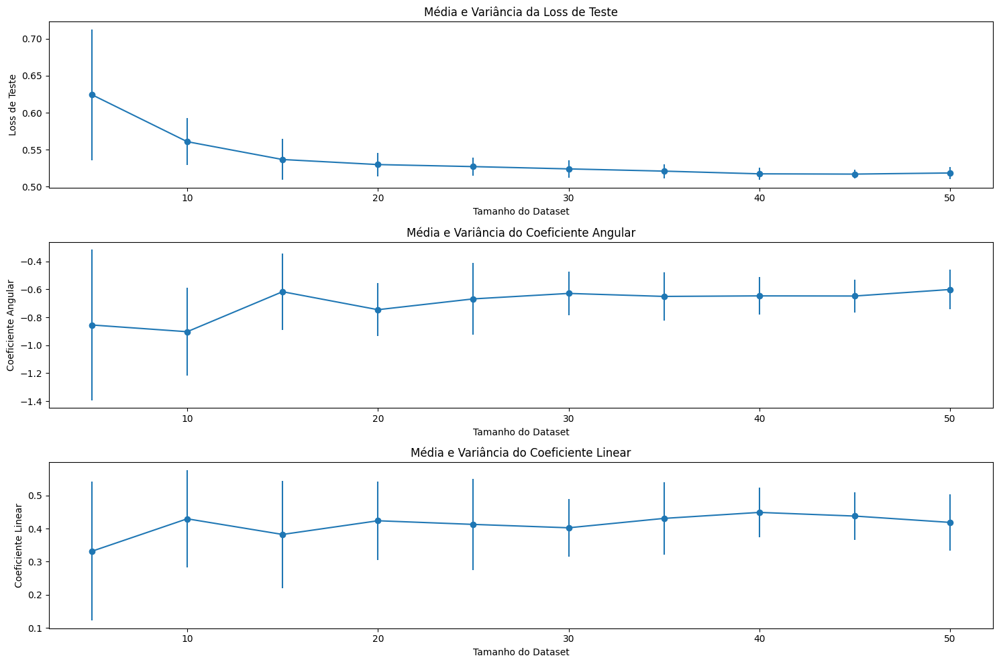

In [ ]:
# Vou optar por usar a MSE para calcular a loss (MSE - Média dos Erros Quadráticos)
def loss(y_true, y_pred):
    return np.mean((y_true - y_pred)**2)

# Só de teste vou deixar o calculo da loss padrão para ver os resultados aqui (curiosidade apenas)
# def loss(y_true, y_pred):
#     return np.sum((y_true - y_pred)**2)

def graphics(losses: np.array, coef_ang:np.array, coef_linear:np.array, size: int):
    """
    Plota gráficos de Loss, Coeficiente Angular e Coeficiente Linear para um tamanho específico de dataset.

    Parâmetros:
    losses : array numpy
        Lista contendo as perdas (loss) dos modelos treinados.
    coef_ang : array numpy
        Lista contendo os coeficientes angulares dos modelos treinados.
    coef_linear : array numpy
        Lista contendo os coeficientes lineares dos modelos treinados.
    size : int
        Tamanho do dataset utilizado para treinamento.
    """

    media_l = np.mean(losses)
    var_l = np.var(losses)

    media_ca = np.mean(coef_ang)
    var_ca = np.var(coef_ang)

    media_cl = np.mean(coef_linear)
    var_cl = np.var(coef_linear)

    fig = plt.figure(figsize=(21, 5))
    fig.suptitle(f'Resultados para tamanho {size}')
    plt.subplot(1, 3, 1)
    plt.title(f'Loss de Teste')
    plt.plot(losses, color='#2f77b8')
    plt.axhline(y=media_l, color='r', linestyle='--', label=f'Média: {media_l:.2f}')
    plt.axhline(y=media_l+var_l, color='g', linestyle='--', label=f'Variância: {var_l:.2f}')
    plt.axhline(y=media_l-var_l, color='g', linestyle='--')
    plt.ylabel('Loss')
    plt.xlabel('Número do modelo')
    plt.legend()

    plt.subplot(1, 3, 2)
    plt.title(f'Coeficiente Angular')
    plt.plot(coef_ang, color='#2f77b8')
    plt.axhline(y=media_ca, color='r', linestyle='--', label=f'Média: {media_ca:.2f}')
    plt.axhline(y=media_ca+var_ca, color='g', linestyle='--', label=f'Variância: {var_ca:.2f}')
    plt.axhline(y=media_ca-var_ca, color='g', linestyle='--')
    plt.ylabel('Coeficiente Angular')
    plt.xlabel('Número do modelo')
    plt.legend()

    plt.subplot(1, 3, 3)
    plt.title(f'Coeficiente Linear')
    plt.plot(coef_linear, color='#2f77b8')
    plt.axhline(y=media_cl, color='r', linestyle='--', label=f'Média: {media_cl:.2f}')
    plt.axhline(y=media_cl+var_cl, color='g', linestyle='--', label=f'Variância: {var_cl:.2f}')
    plt.axhline(y=media_cl-var_cl, color='g', linestyle='--')
    plt.ylabel('Coeficiente Linear')
    plt.xlabel('Número do modelo')
    plt.legend()

    plt.show()

def comparative_graphs(dataset_sizes, test_losses, coef_angulares, coef_lineares):
    """
    Plota gráficos comparativos de Loss de Teste, Coeficiente Angular e Coeficiente Linear para múltiplos tamanhos de datasets.

    Parâmetros:
    dataset_sizes : list
        Lista de diferentes tamanhos de datasets.
    test_losses : array numpy
        Lista contendo as médias e variâncias da loss de teste para cada tamanho de dataset.
    coef_angulares : array numpy
        Lista contendo as médias e variâncias dos coeficientes angulares para cada tamanho de dataset.
    coef_lineares : array numpy
        Lista contendo as médias e variâncias dos coeficientes lineares para cada tamanho de dataset.
    """

    test_losses = np.array(test_losses)
    coef_angulares = np.array(coef_angulares)
    coef_lineares = np.array(coef_lineares)

    plt.figure(figsize=(15, 10))

    plt.subplot(3, 1, 1)
    plt.errorbar(dataset_sizes, test_losses[:, 0], yerr=np.sqrt(test_losses[:, 1]), fmt='-o')
    plt.title('Média e Variância da Loss de Teste')
    plt.xlabel('Tamanho do Dataset')
    plt.ylabel('Loss de Teste')

    plt.subplot(3, 1, 2)
    plt.errorbar(dataset_sizes, coef_angulares[:, 0], yerr=np.sqrt(coef_angulares[:, 1]), fmt='-o')
    plt.title('Média e Variância do Coeficiente Angular')
    plt.xlabel('Tamanho do Dataset')
    plt.ylabel('Coeficiente Angular')

    plt.subplot(3, 1, 3)
    plt.errorbar(dataset_sizes, coef_lineares[:, 0], yerr=np.sqrt(coef_lineares[:, 1]), fmt='-o')
    plt.title('Média e Variância do Coeficiente Linear')
    plt.xlabel('Tamanho do Dataset')
    plt.ylabel('Coeficiente Linear')

    plt.tight_layout()
    plt.show()

sizes = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]
n_experiments = 30

test_losses_global = []
coef_angulares_global = []
coef_lineares_global = []

for tam in sizes:
    losses = []
    coef_ang = []
    coef_lin = []
    for i in range(n_experiments):
        x_train, y_train = generate_dataset(tam, True)
        model = LinearRegression()
        model.fit(x_train, y_train)

        y_pred = model.predict(x_test)
        loss_test = loss(y_test, y_pred)
        ca = model.coef_[0]
        cl = model.intercept_

        losses.append(loss_test)
        coef_ang.append(ca)
        coef_lin.append(cl)

    graphics(losses, coef_ang, coef_lin, tam)

    test_losses_global.append((np.mean(losses), np.var(losses)))
    coef_angulares_global.append((np.mean(coef_ang), np.var(coef_ang)))
    coef_lineares_global.append((np.mean(coef_lin), np.var(coef_lin)))

comparative_graphs(sizes, test_losses_global, coef_angulares_global, coef_lineares_global)

## **Alternativa B**

Os gráficos de Média e Variância mostram que a loss diminui à medida que o tamanho do dataset aumenta. Isso ocorre principalmente porque, com mais dados, o modelo tem mais informações para mitigar o erro e generalizar melhor. Além disso, a variância também diminui, já que o impacto de amostras aleatórias e do ruído nos dados é diluído com mais exemplos, tornando o modelo mais estável.

<br>É fácil de observar que o coeficiente angular teve um aumento na sua média com o aumento do tamanho do dataset, mas obteve uma diminuição da variância, isso se da porque um dataset pequeno, o modelo de regressão linear pode não ser capaz de capturar adequadamente a tendência real nos dados, resultando em uma estimativa menos precisa do coeficiente angular. Isso leva a uma maior variabilidade (variância) nos coeficientes angulares quando você repete o experimento várias vezes com diferentes subconjuntos de dados pequenos.

<br/>Podemos observar também que, no Gráfico de Média e Variância do Coeficiente Linear, há uma estabilização da média à medida que o tamanho do dataset aumenta, indicando que o modelo está capturando melhor a tendência subjacente. A clara diminuição da variância ocorre porque, com mais dados, o impacto do ruído e das flutuações aleatórias nas estimativas do coeficiente é reduzido, permitindo que o modelo seja mais consistente e preciso em diferentes execuções.

## **Alternativa C**

Para ser sincero não sei a resposta... vou testar então para conseguir responder.

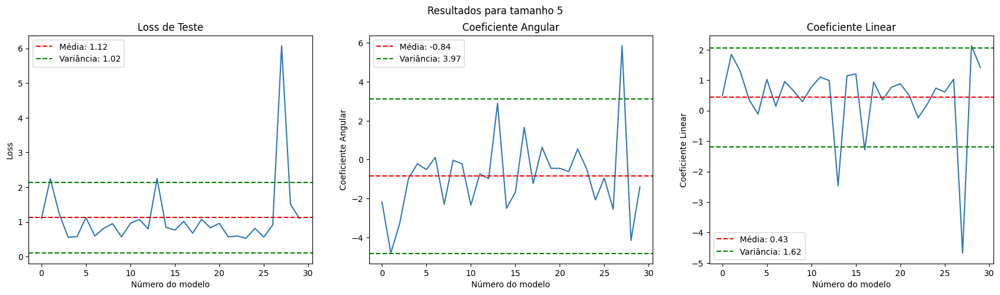

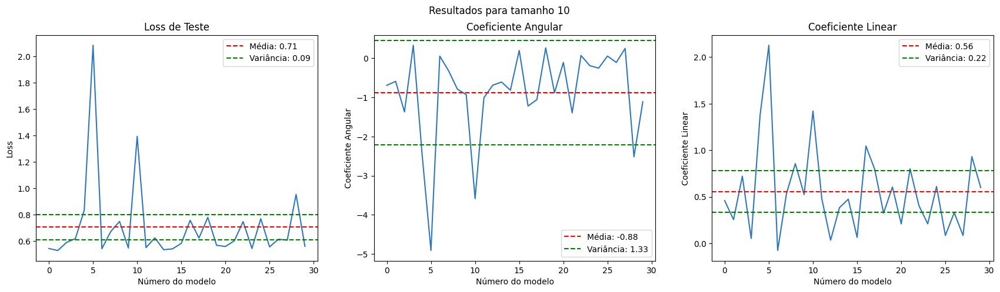

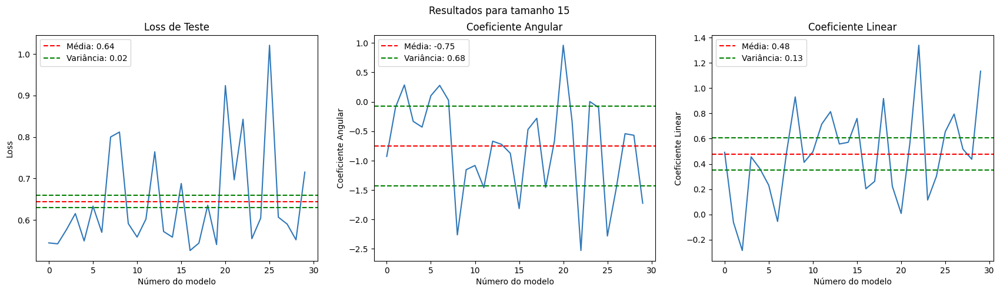

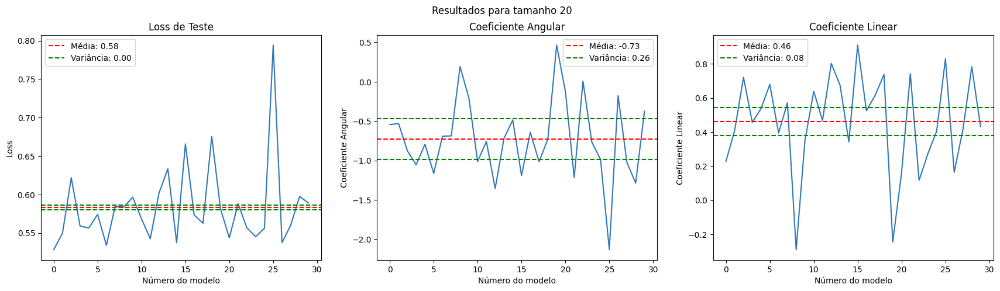

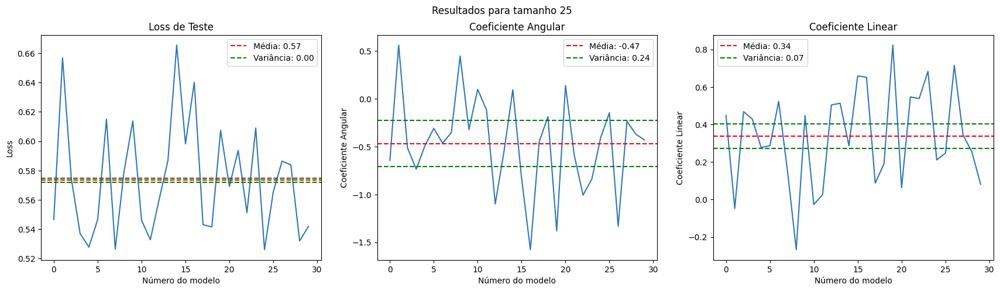

...

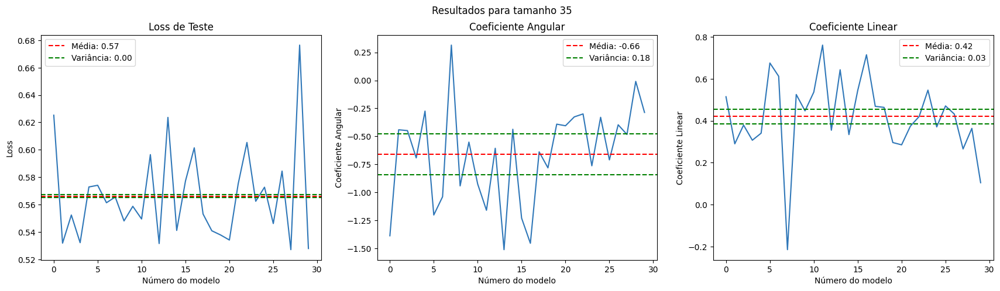

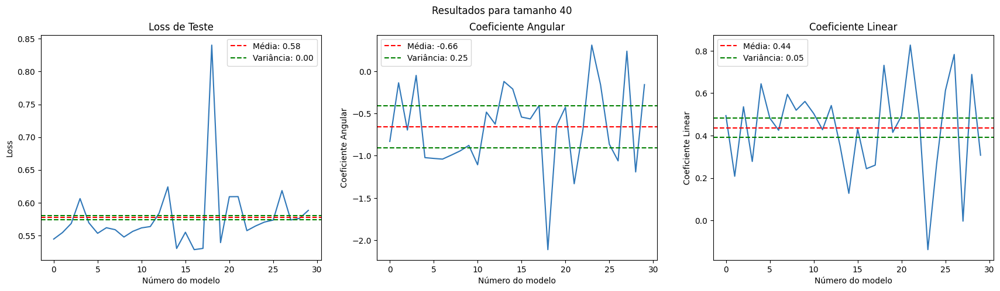

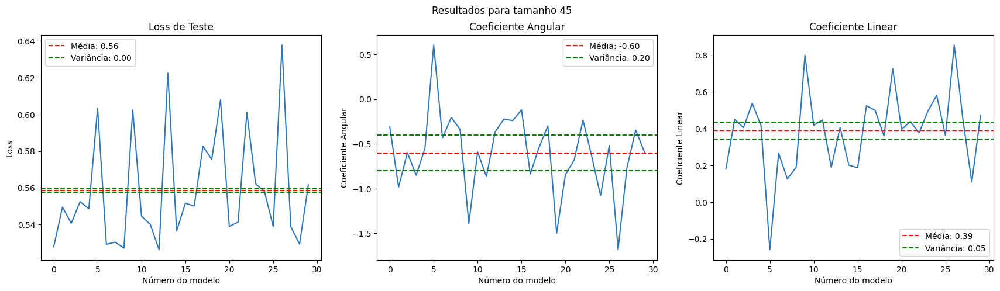

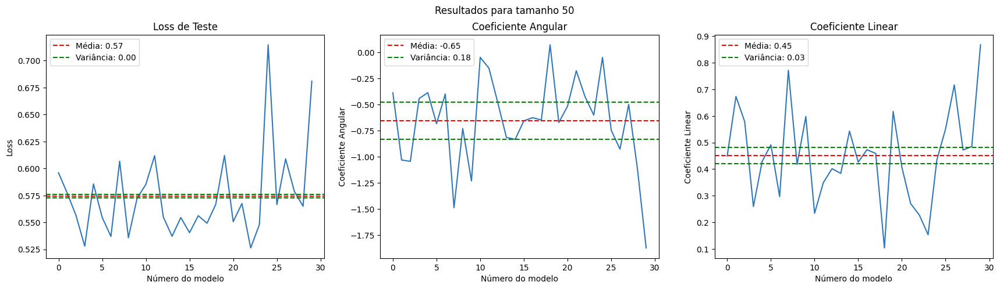

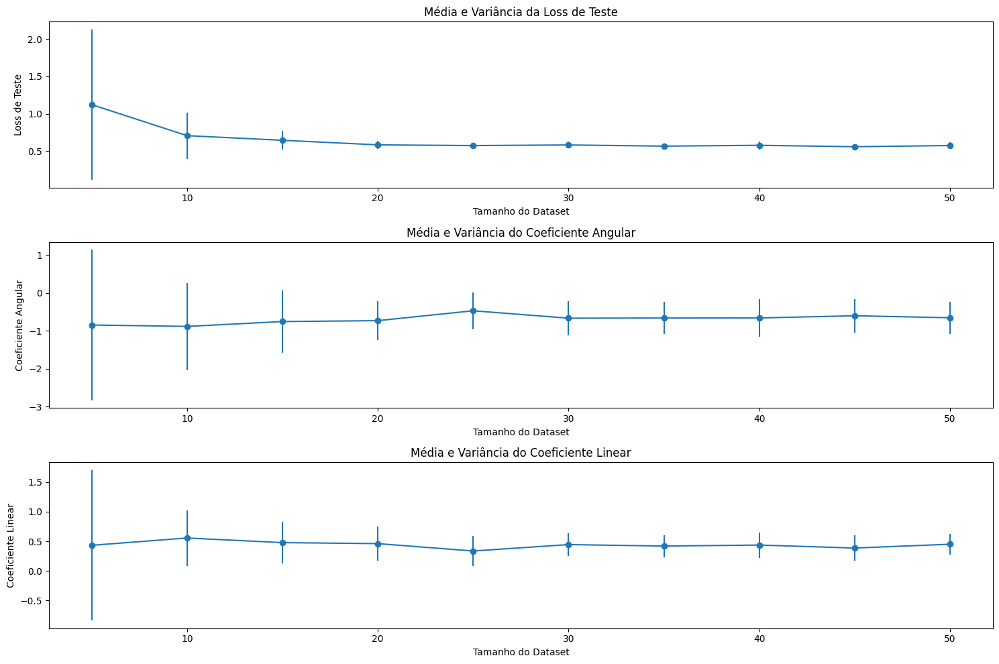

In [ ]:
test_losses_global = []
coef_angulares_global = []
coef_lineares_global = []

for tam in sizes:
    losses = []
    coef_ang = []
    coef_lin = []
    for i in range(n_experiments):
        x_train, y_train = generate_dataset(tam, False) # Modificando para verificar se controlar afeta ou não, mas imagino que sim rsrs. Até por isso existe a opção de controlar rsrs.
        model = LinearRegression()
        model.fit(x_train, y_train)

        y_pred = model.predict(x_test)
        loss_test = loss(y_test, y_pred)
        ca = model.coef_[0]
        cl = model.intercept_

        losses.append(loss_test)
        coef_ang.append(ca)
        coef_lin.append(cl)

    # Gráficos detalhados por tamanho do data
    graphics(losses, coef_ang, coef_lin, tam)

    # Adicionando para os nossos gráficos comparativos
    test_losses_global.append((np.mean(losses), np.var(losses)))
    coef_angulares_global.append((np.mean(coef_ang), np.var(coef_ang)))
    coef_lineares_global.append((np.mean(coef_lin), np.var(coef_lin)))
comparative_graphs(sizes, test_losses_global, coef_angulares_global, coef_lineares_global)

Claramente apresentou resultados diferentes, mas eu não consegui formular uma resposta só olhando para os gráficos, então fui atrás de mais respostas.

E cheguei em alguns pontos...

Controlar os dados, me permite:


*   Gerar uma sequência ordenada de valores uniformemente espaçados entre 0 e 1. Isso quer dizer que os dados de entrada estão bem distribuídos em todo o intervalo, o que permite o modelo ter uma amostragem completa e uniforme do espaço de entrada.
    *   O que vai me trazer mais facilidade em capturar a relação entre x e y, resultando em uma convergência mais rápida
    *   Como a distribuição de X vai estar mais equilibrada, há mais chances do modelo aprender a verdadeira relação entre X e Y.
*   Fornecer uma distribuição uniforme dos dados de entrada, facilitando o aprendizado do modelo, principalmente em datasets pequenos, e resultando em estimativas mais estáveis




---



E eu ainda consigo ir mais longe...

**Loss de Teste**:
Nos gráficos com dados controlados, a loss caiu de forma mais pronunciada à medida que o tamanho do dataset aumentou. No sem controle, a diminuição da loss foi menos acentuada e pareceu estabilizar em torno de um certo valor.
Nisso, observamos que, com dados controlados, o modelo foi capaz de capturar a relação entre as variáveis, já que x estava mais uniformemente distribuído. Com dados não controlados, há menos estrutura nos dados de entrada, o que pode dificultar o aprendizado do modelo.

**Coeficiente Angular e Linear**:
Assim como no gráfico com controle, tanto o coeficiente angular quanto o coeficiente linear mostram uma estabilização conforme o dataset cresce. Isso é esperado, já que mais dados ajudam o modelo a estimar os coeficientes de forma mais consistente.
A variação dos coeficientes é visivelmente menor com o aumento do tamanho do dataset, tanto nos dados controlados quanto nos não controlados, indicando que, independentemente do controle dos dados, o aumento do dataset reduz a incerteza nas estimativas dos coeficientes.

Dados controlados resultam em uma queda mais significativa da loss e maior estabilidade desde o início, indicando que o modelo tem uma visão mais clara da relação entre x e y.
Dados não controlados introduzem uma aleatoriedade que pode, em alguns casos, dificultar o aprendizado inicial. No entanto, conforme o dataset cresce, a diferença entre as abordagens pode se tornar menos significativa, já que a quantidade de dados é suficiente para suavizar a aleatoriedade





---



---



# Questão 2

Exercício 2:

a)

Gere datasets de tamanhos 10, 30 e 50 considerando o caso em que o input é controlado durante a coleta. Para cada dataset, aplique uma transformação polinomial no input ([PolynomialFeatures](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.PolynomialFeatures.html#sklearn.preprocessing.PolynomialFeatures)) para o treinamento de modelos não-lineares. Varie o grau do polinômio e justifique com gráficos o melhor grau para cada tamanho de dataset avaliado.

Novamente, para cada tamanho, gere pelo menos 30 datasets diferentes e evidencie os resultados dos seus gráficos considerando a média e variância dos resultados obtidos para cada modelo treinado.

b)

Os modelos obtidos são melhores ou piores do que os modelos lineares obtidos no exercício anterior? Justifique quantitativamente a sua resposta.

c)

Explique em poucas palavras o comportamento observado nos gráficos apresentados no item anterior.

d)

Os resultados deveriam mudar caso os datasets fossem gerados considerando o caso em que o input não é controlado durante a coleta? Justifique sua resposta.

## **Alternativa A**

In [ ]:
from sklearn.metrics import mean_squared_error ## para calcular o erro quadrático médio (MSE - Mean Squared Error) entre os valores verdadeiros e os valores previstos de um modelo,
## vou usar ela para conseguir normalizar e comparar entre N modelos diferentes

In [ ]:
def graphics_exec_2(losses_huber, losses_mse, tamanho, grau):
    media_loss_huber = np.mean(losses_huber)
    var_loss_huber = np.var(losses_huber)

    media_loss_mse = np.mean(losses_mse)
    var_loss_mse = np.var(losses_mse)

    fig, axes = plt.subplots(2, 2, figsize=(15, 10))

    axes[0, 0].plot(losses_mse, 'o-', label='Loss (MSE)', color='#ff5733')
    axes[0, 0].set_title(f'Loss (MSE) para Tamanho: {tamanho}, Grau: {grau}')
    axes[0, 0].set_xlabel('Número do Modelo')
    axes[0, 0].set_ylabel('Loss (MSE)')
    axes[0, 0].legend()
    axes[0, 0].grid(True)

    axes[0, 1].plot(losses_huber, 'o-', label='Loss (Huber)', color='#2f77b8')
    axes[0, 1].set_title(f'Loss (Huber) para Tamanho: {tamanho}, Grau: {grau}')
    axes[0, 1].set_xlabel('Número do Modelo')
    axes[0, 1].set_ylabel('Loss (Huber)')
    axes[0, 1].legend()
    axes[0, 1].grid(True)

    axes[1, 0].axhline(y=media_loss_mse, color='orange', linestyle='--', label=f'Média Loss (MSE): {media_loss_mse:.2f}')
    axes[1, 0].axhline(y=media_loss_mse + var_loss_mse, color='green', linestyle='--', label=f'Variância (MSE) Upper: {media_loss_mse + var_loss_mse:.2f}')
    axes[1, 0].axhline(y=media_loss_mse - var_loss_mse, color='green', linestyle='--', label=f'Variância (MSE) Lower: {media_loss_mse - var_loss_mse:.2f}')
    axes[1, 0].set_title(f'Média e Variância das Losses (MSE)')
    axes[1, 0].set_ylabel('Loss (MSE)')
    axes[1, 0].legend()
    axes[1, 0].grid(True)

    axes[1, 1].axhline(y=media_loss_huber, color='blue', linestyle='--', label=f'Média Loss (Huber): {media_loss_huber:.2f}')
    axes[1, 1].axhline(y=media_loss_huber + var_loss_huber, color='purple', linestyle='--', label=f'Variância (Huber) Upper: {media_loss_huber + var_loss_huber:.2f}')
    axes[1, 1].axhline(y=media_loss_huber - var_loss_huber, color='purple', linestyle='--', label=f'Variância (Huber) Lower: {media_loss_huber - var_loss_huber:.2f}')
    axes[1, 1].set_title(f'Média e Variância das Losses (Huber)')
    axes[1, 1].set_ylabel('Loss (Huber)')
    axes[1, 1].legend()
    axes[1, 1].grid(True)

    plt.tight_layout()
    plt.show()

Vou comparar agora a Mean Squared Error (MSE) com a Huber Loss para entender como cada função de perda lida com erros nas previsões. A MSE penaliza erros quadráticos, tornando-a sensível a outliers. Em contrapartida, a Huber Loss combina as vantagens da MSE para erros pequenos com uma abordagem linear para erros grandes, o que a torna mais robusta a outliers.

Escolhi apresentar as duas só por questão de testes e de aprendizado em si.

In [ ]:
def huber_loss(y_true, y_pred, delta=1.0):
    error = y_true - y_pred
    is_small_error = np.abs(error) <= delta
    squared_loss = 0.5 * error**2
    linear_loss = delta * (np.abs(error) - 0.5 * delta)
    return np.where(is_small_error, squared_loss, linear_loss).sum()

# funçãozinha para treinarmos nosso modelo ajustando a regressão linear às características polinomiais
# geradas a partir das variáveis de entrada

def train_polynomial_model(x_train, y_train, x_test, y_test, degree, delta=1.0):
    poly = PolynomialFeatures(degree=degree)
    x_poly_train = poly.fit_transform(x_train)

    model = LinearRegression()
    model.fit(x_poly_train, y_train)

    y_pred = model.predict(poly.transform(x_test))

    huber_loss_value = huber_loss(y_test, y_pred, delta)
    mse_value = mean_squared_error(y_test, y_pred)

    return model, poly, huber_loss_value, mse_value


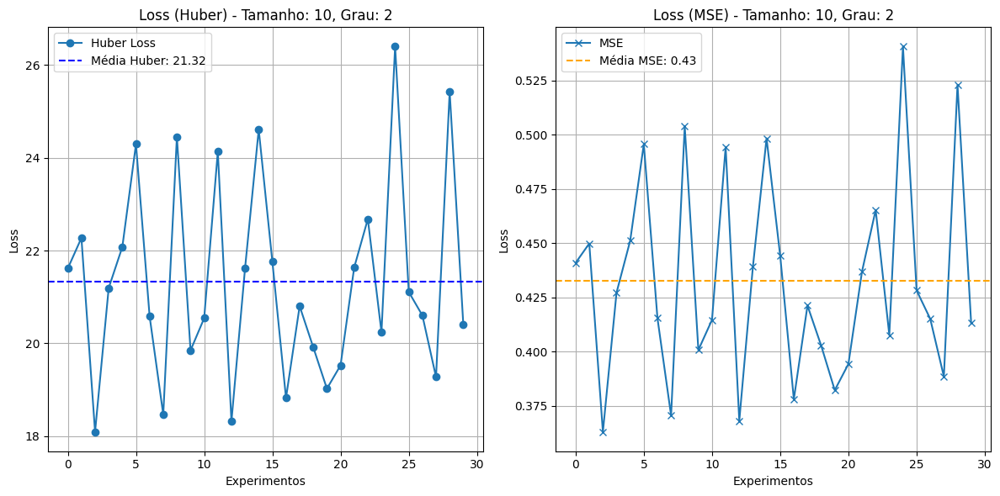

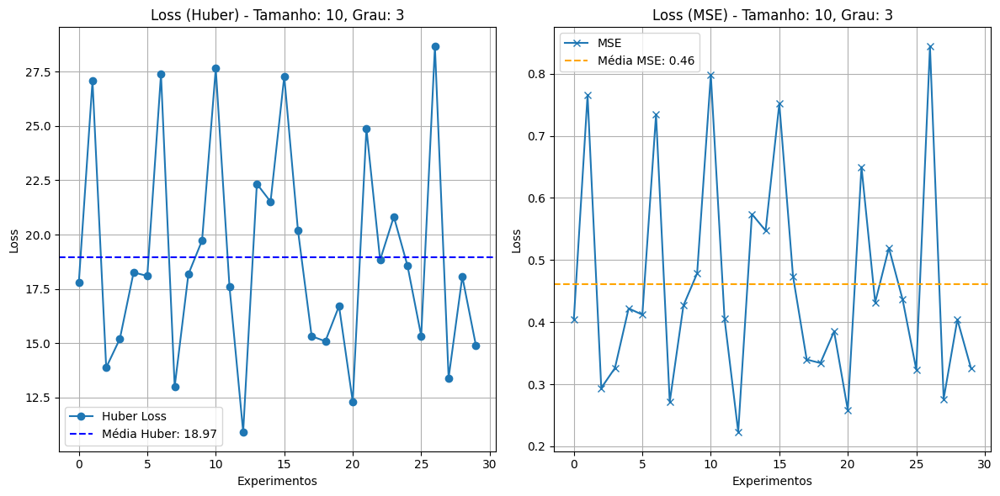

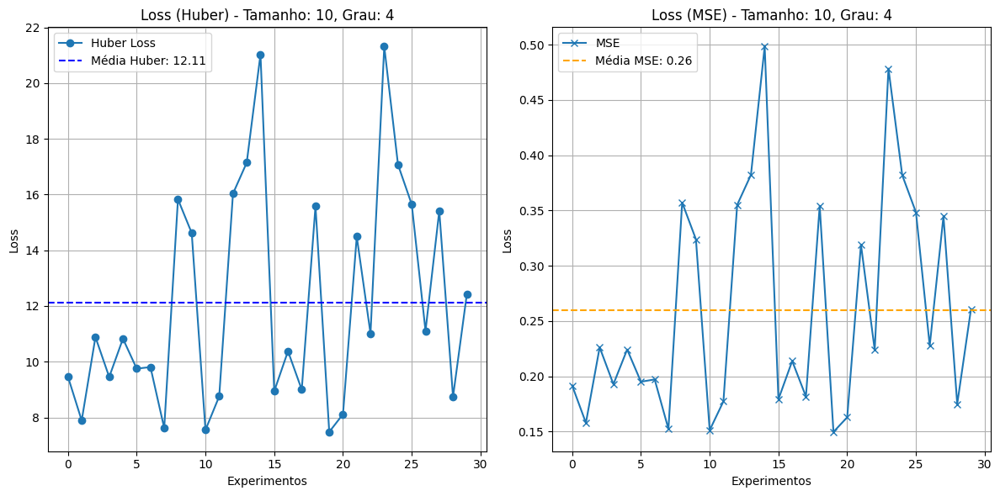

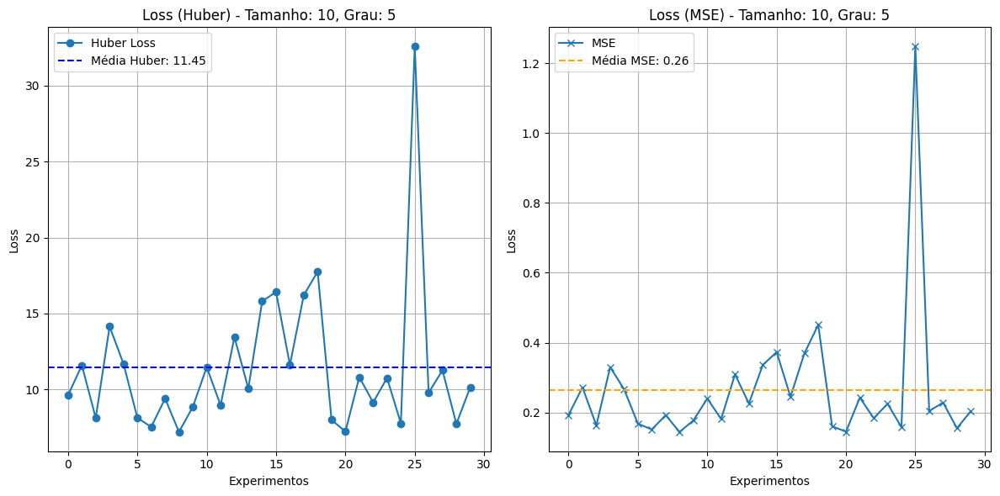

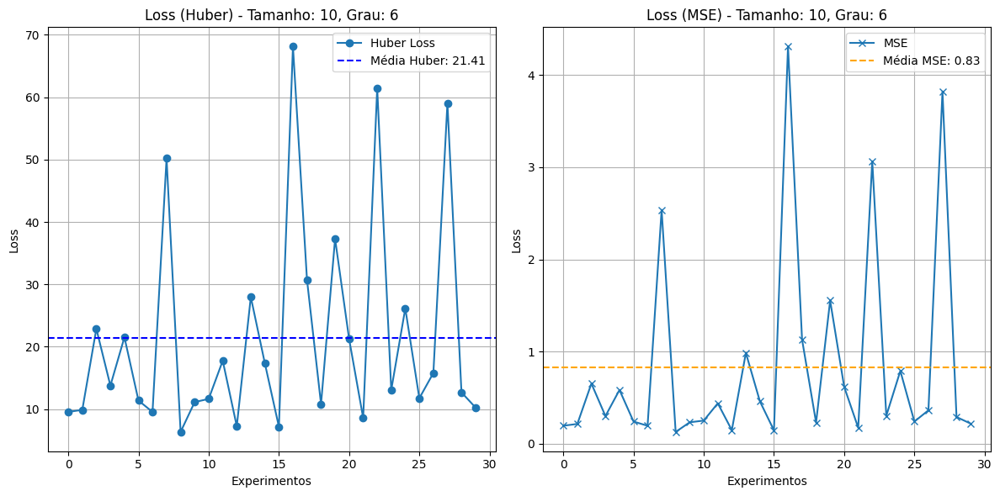

...

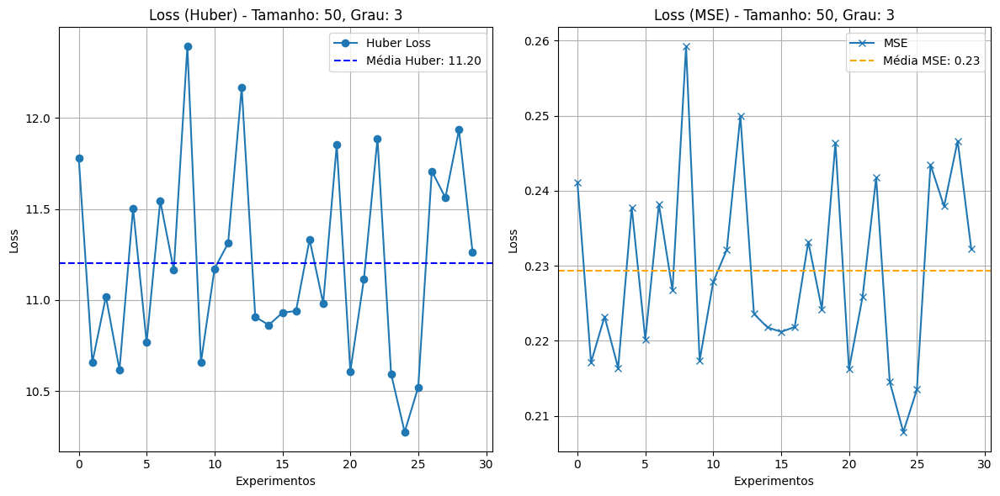

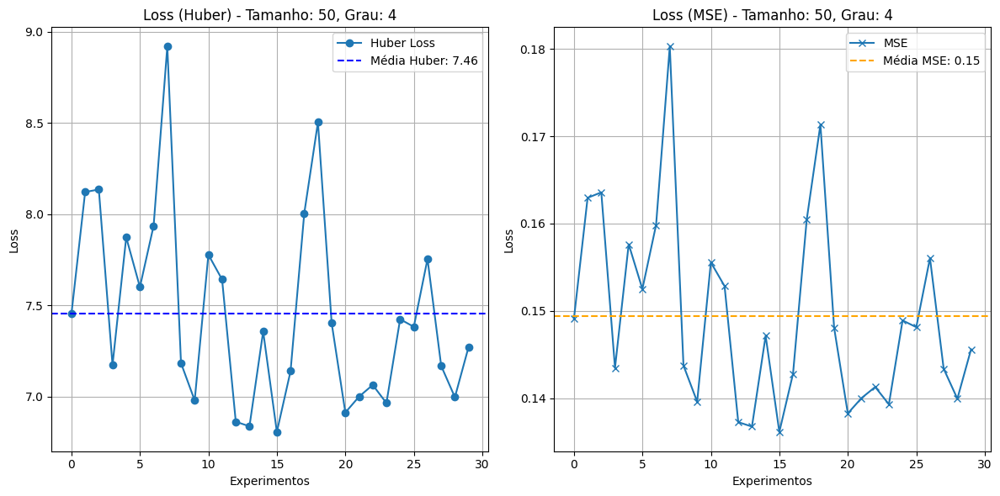

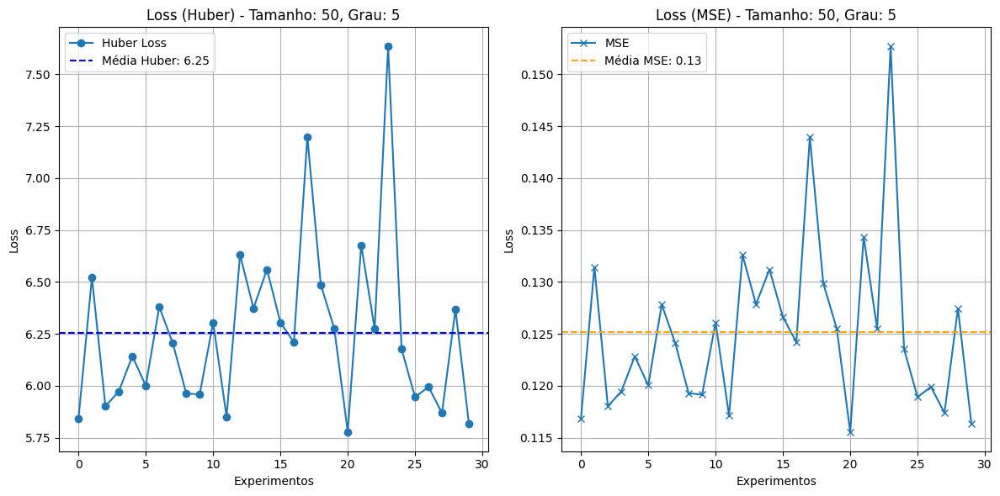

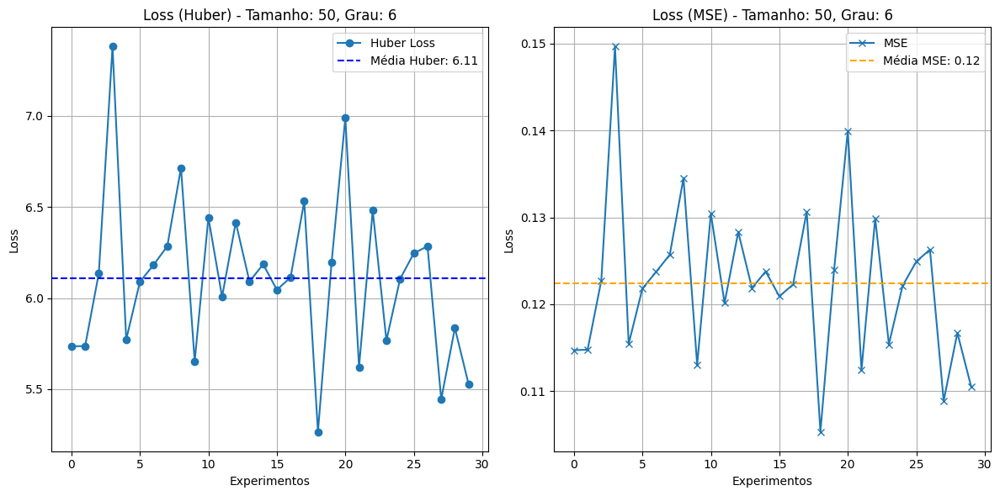

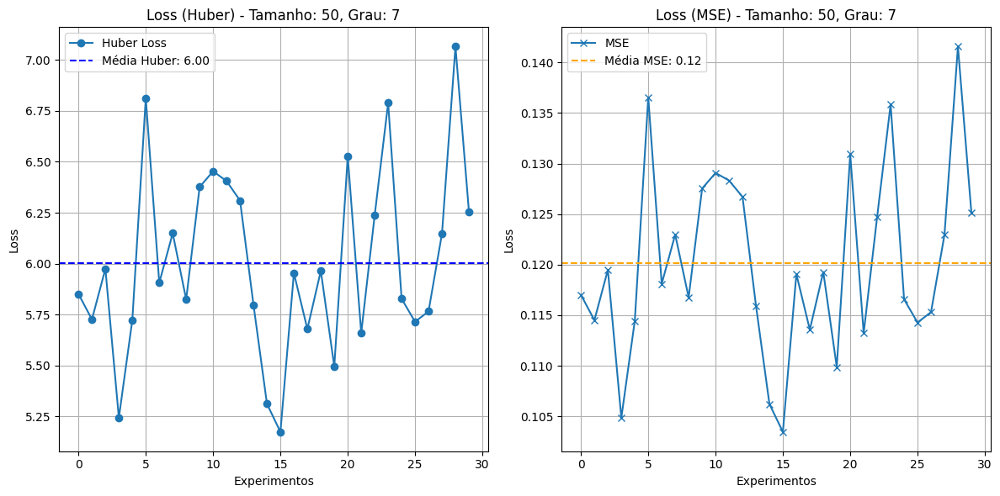

In [ ]:
tamanhos = [10, 30, 50]
graus = [2, 3, 4, 5, 6, 7]
n_experiments = 30

# aqui eu quis testar como era o cálculo tanto da MSE, quanto da Huber.
# Para isso, eu coloquei eles lado a lado para verificar sua movimentação.
# adicionei a média também para entender melhor como cada função se comporta sob
# diferentes condições de tamanho e grau do polinômio

for tam in tamanhos:
    for grau in graus:
        losses_huber = []
        losses_mse = []

        for i in range(n_experiments):
            # dados de treino
            x_train, y_train = generate_dataset(tam, True)
            # dados de teste to puxando da função la de cima

            _, _, huber_loss_value, mse_value = train_polynomial_model(x_train, y_train, x_test, y_test, grau)
            losses_huber.append(huber_loss_value)
            losses_mse.append(mse_value)

        media_huber = np.mean(losses_huber)
        media_mse = np.mean(losses_mse)
        plt.figure(figsize=(12, 6))

        plt.subplot(1, 2, 1)
        plt.plot(losses_huber, label='Huber Loss', marker='o')
        plt.axhline(y=media_huber, color='blue', linestyle='--', label=f'Média Huber: {media_huber:.2f}')
        plt.title(f'Loss (Huber) - Tamanho: {tam}, Grau: {grau}')
        plt.xlabel('Experimentos')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid()

        plt.subplot(1, 2, 2)
        plt.plot(losses_mse, label='MSE', marker='x')
        plt.axhline(y=media_mse, color='orange', linestyle='--', label=f'Média MSE: {media_mse:.2f}')
        plt.title(f'Loss (MSE) - Tamanho: {tam}, Grau: {grau}')
        plt.xlabel('Experimentos')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid()

        plt.tight_layout()
        plt.show()

In [ ]:
# aqui estamos testando o cálculo das perdas Huber e MSE para diferentes tamanhos de dataset
# e graus de polinômio. A ideia é analisar como essas funções de perda se comportam em relação
# ao grau do polinômio, permitindo uma comparação direta entre elas.


tamanhos = [10, 30, 50]
graus = list(range(2, 8))
n_experiments = 30

mean_huber = {tam: [] for tam in tamanhos}
std_huber = {tam: [] for tam in tamanhos}
mean_mse = {tam: [] for tam in tamanhos}
std_mse = {tam: [] for tam in tamanhos}

for tam in tamanhos:
    for grau in graus:
        losses_huber = []
        losses_mse = []

        for i in range(n_experiments):
            x_train, y_train = generate_dataset(tam, True)

            _, _, huber_loss_value, mse_value = train_polynomial_model(x_train, y_train, x_test, y_test, grau)
            losses_huber.append(huber_loss_value)
            losses_mse.append(mse_value)

        media_huber = np.mean(losses_huber)
        desvio_huber = np.std(losses_huber)
        media_mse = np.mean(losses_mse)
        desvio_mse = np.std(losses_mse)

        mean_huber[tam].append(media_huber)
        std_huber[tam].append(desvio_huber)
        mean_mse[tam].append(media_mse)
        std_mse[tam].append(desvio_mse)

# graficos com os eixos originais
plt.figure(figsize=(14, 6))

# grafico para Média da Huber Loss vs Grau do Polinômio
plt.subplot(1, 2, 1)
for tam in tamanhos:
    plt.errorbar(graus, mean_huber[tam], yerr=std_huber[tam], marker='o', label=f'Tamanho {tam}', capsize=5)
plt.title('Média da Huber Loss vs Grau do Polinômio')
plt.xlabel('Grau do Polinômio')
plt.ylabel('Média da Huber Loss')
plt.legend()
plt.grid(True)

# grafico para Média da MSE vs Grau do Polinômio
plt.subplot(1, 2, 2)
for tam in tamanhos:
    plt.errorbar(graus, mean_mse[tam], yerr=std_mse[tam], marker='s', label=f'Tamanho {tam}', capsize=5)
plt.title('Média da MSE vs Grau do Polinômio')
plt.xlabel('Grau do Polinômio')
plt.ylabel('Média da MSE')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

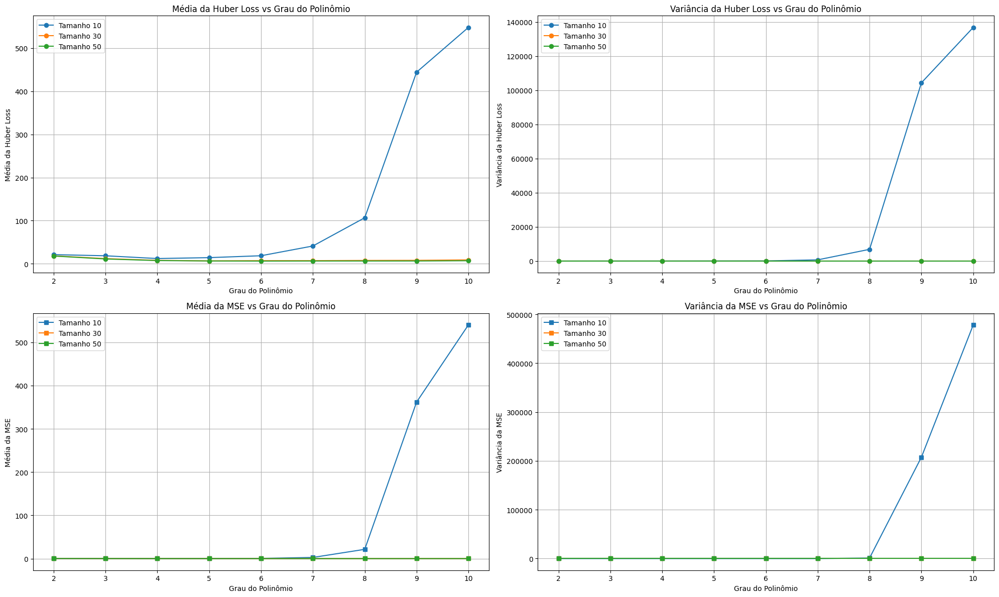

In [ ]:
tamanhos = [10, 30, 50]
graus = list(range(2, 11))  # vou add mais graus para maior granularidade
n_experiments = 30

mean_huber = {tam: [] for tam in tamanhos}
var_huber = {tam: [] for tam in tamanhos}
mean_mse = {tam: [] for tam in tamanhos}
var_mse = {tam: [] for tam in tamanhos}

for tam in tamanhos:
    for grau in graus:
        losses_huber = []
        losses_mse = []

        for i in range(n_experiments):
            x_train, y_train = generate_dataset(tam, True)

            _, _, huber_loss_value, mse_value = train_polynomial_model(x_train, y_train, x_test, y_test, grau)

            losses_huber.append(huber_loss_value)
            losses_mse.append(mse_value)

        media_huber = np.mean(losses_huber)
        variancia_huber = np.var(losses_huber)
        media_mse = np.mean(losses_mse)
        variancia_mse = np.var(losses_mse)

        mean_huber[tam].append(media_huber)
        var_huber[tam].append(variancia_huber)
        mean_mse[tam].append(media_mse)
        var_mse[tam].append(variancia_mse)

fig, axs = plt.subplots(2, 2, figsize=(20, 12))

# grafico 1: Média Huber
for tam in tamanhos:
    axs[0, 0].plot(graus, mean_huber[tam], marker='o', label=f'Tamanho {tam}')
axs[0, 0].set_title('Média da Huber Loss vs Grau do Polinômio')
axs[0, 0].set_xlabel('Grau do Polinômio')
axs[0, 0].set_ylabel('Média da Huber Loss')
axs[0, 0].legend()
axs[0, 0].grid(True)

# grafico 2: Variância Huber
for tam in tamanhos:
    axs[0, 1].plot(graus, var_huber[tam], marker='o', label=f'Tamanho {tam}')
axs[0, 1].set_title('Variância da Huber Loss vs Grau do Polinômio')
axs[0, 1].set_xlabel('Grau do Polinômio')
axs[0, 1].set_ylabel('Variância da Huber Loss')
axs[0, 1].legend()
axs[0, 1].grid(True)

# grafico 3: Média MSE
for tam in tamanhos:
    axs[1, 0].plot(graus, mean_mse[tam], marker='s', label=f'Tamanho {tam}')
axs[1, 0].set_title('Média da MSE vs Grau do Polinômio')
axs[1, 0].set_xlabel('Grau do Polinômio')
axs[1, 0].set_ylabel('Média da MSE')
axs[1, 0].legend()
axs[1, 0].grid(True)

for tam in tamanhos:
    axs[1, 1].plot(graus, var_mse[tam], marker='s', label=f'Tamanho {tam}')
axs[1, 1].set_title('Variância da MSE vs Grau do Polinômio')
axs[1, 1].set_xlabel('Grau do Polinômio')
axs[1, 1].set_ylabel('Variância da MSE')
axs[1, 1].legend()
axs[1, 1].grid(True)

plt.tight_layout()
plt.show()

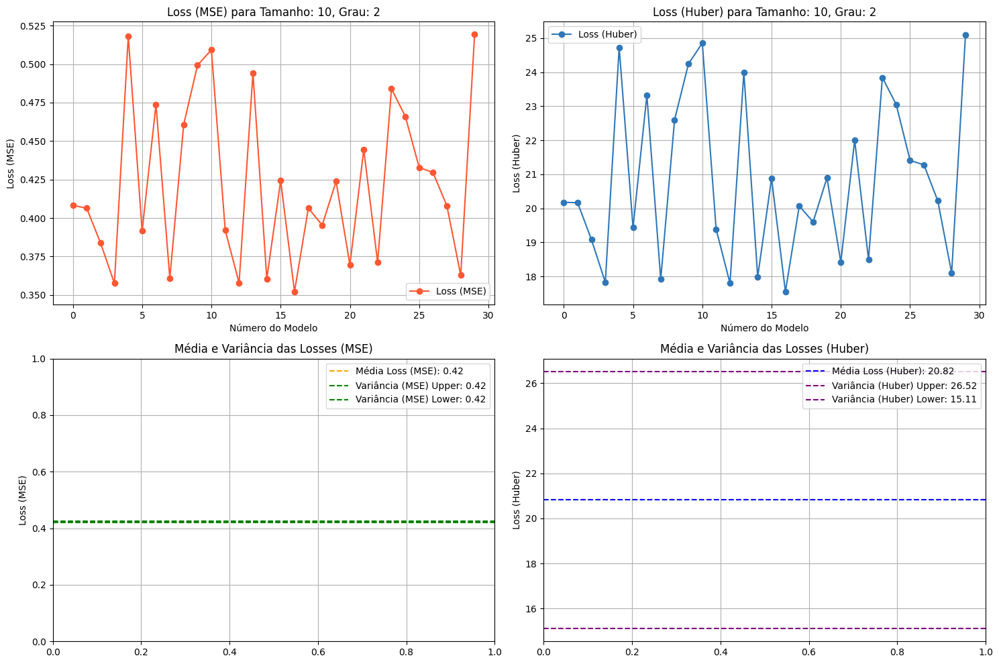

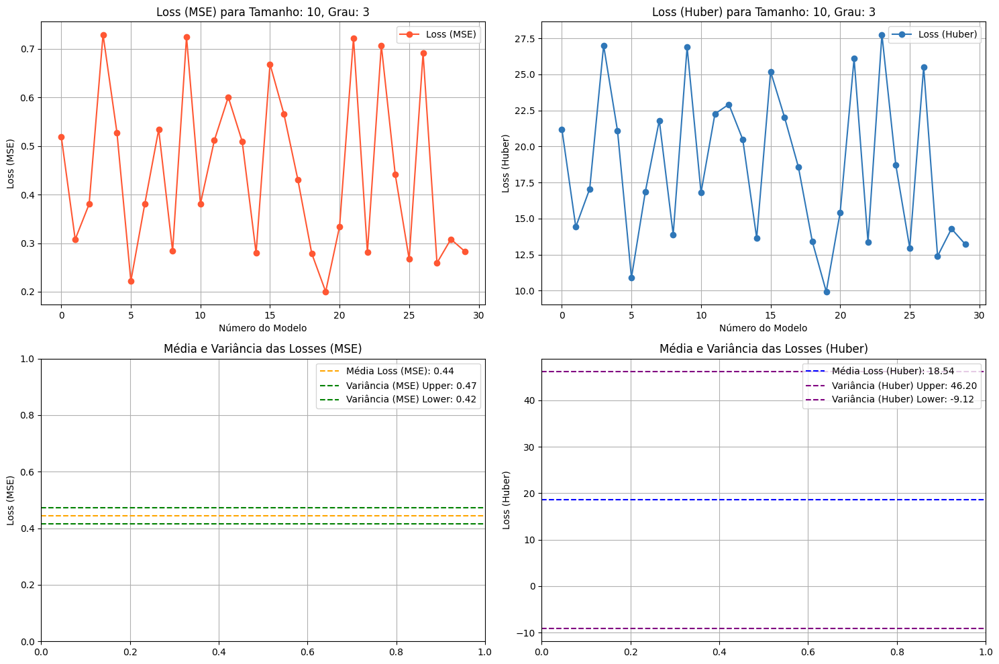

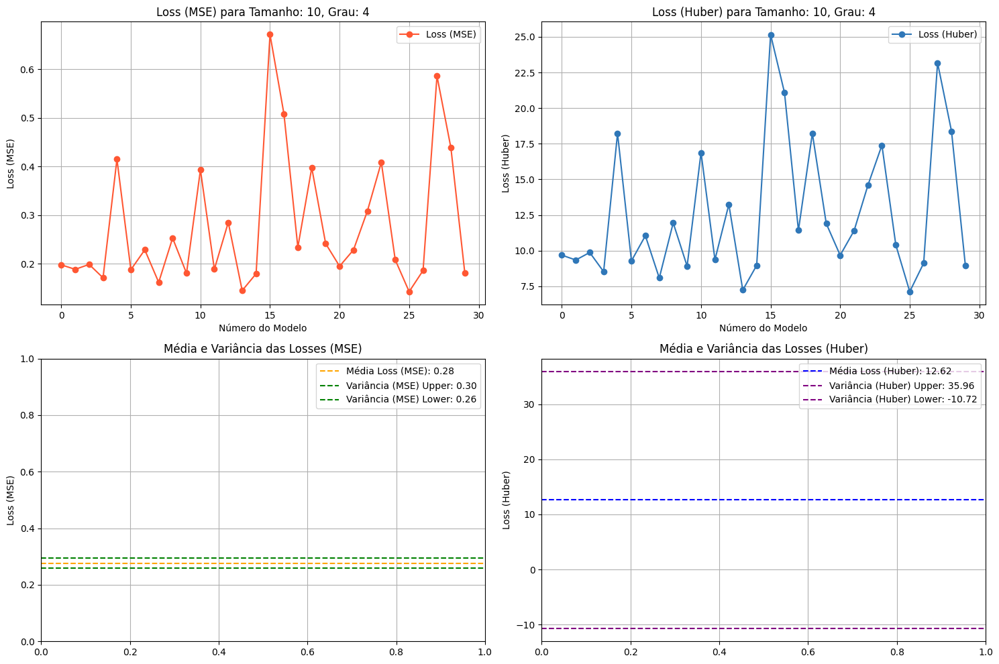

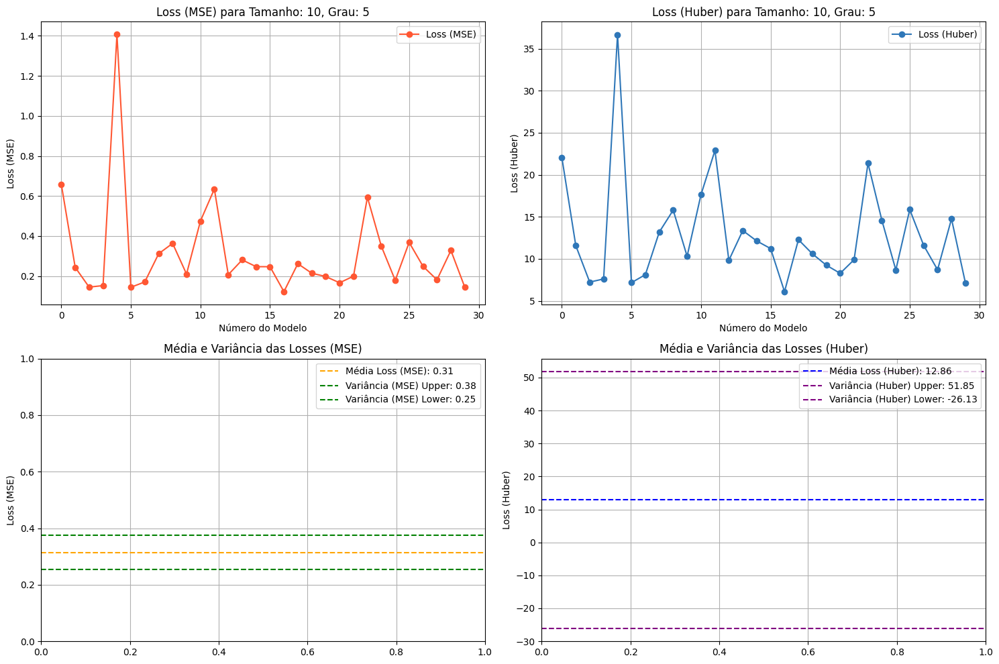

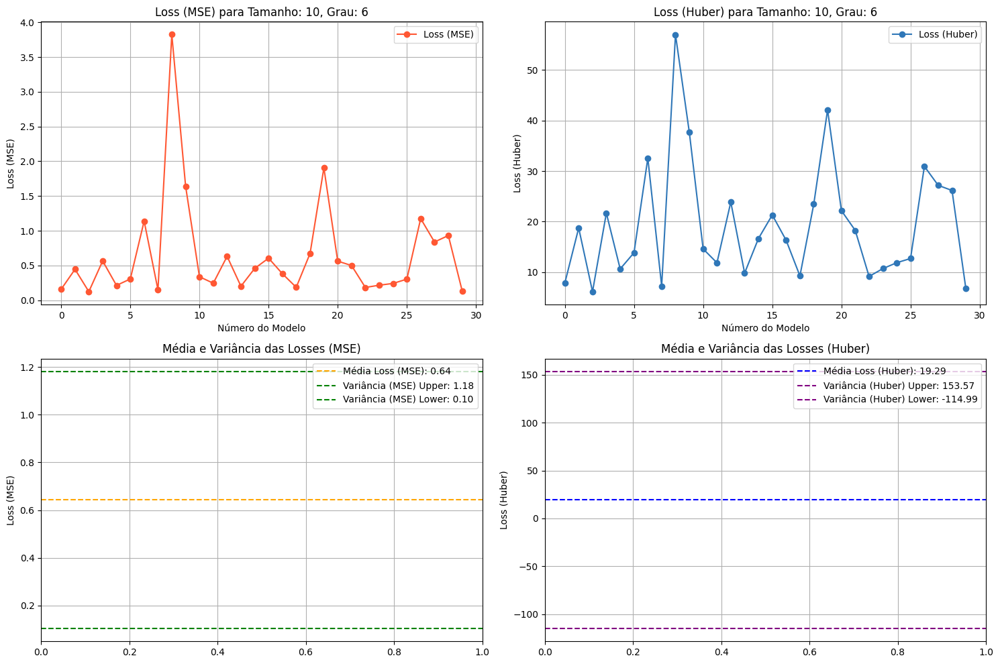

...

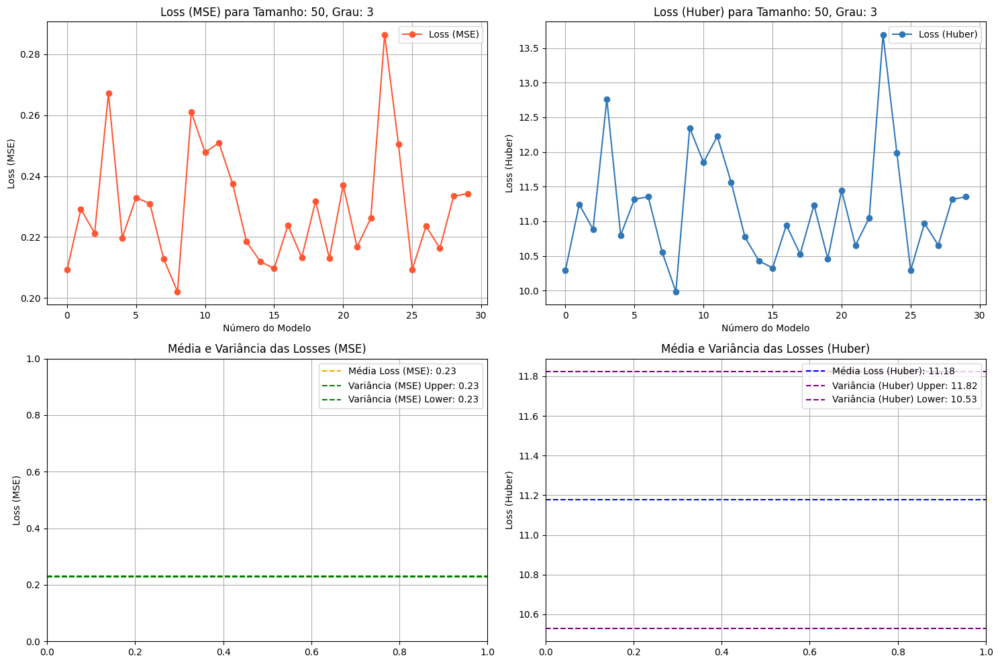

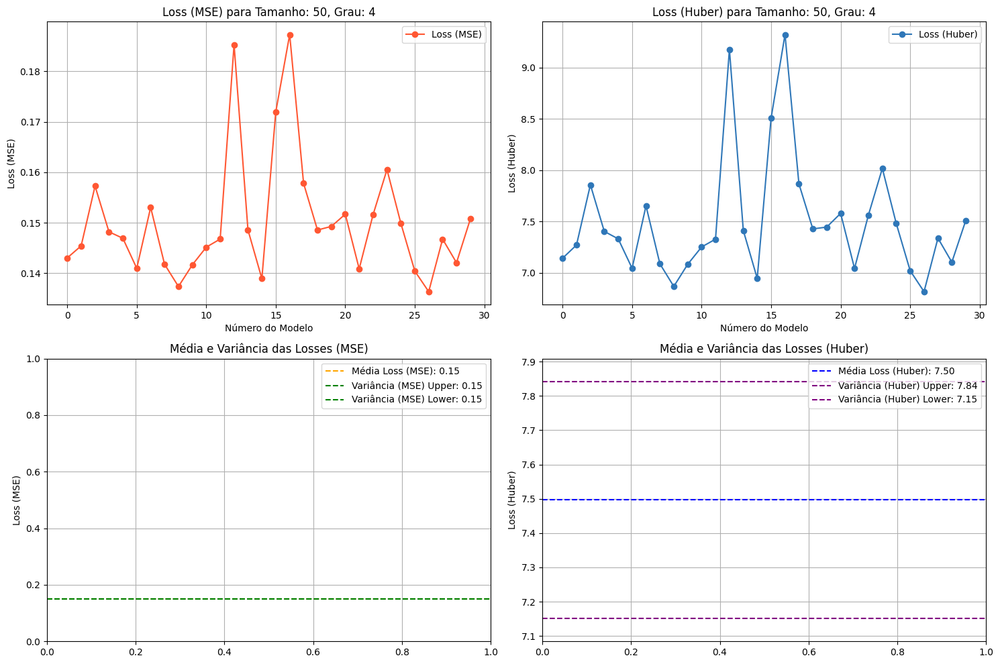

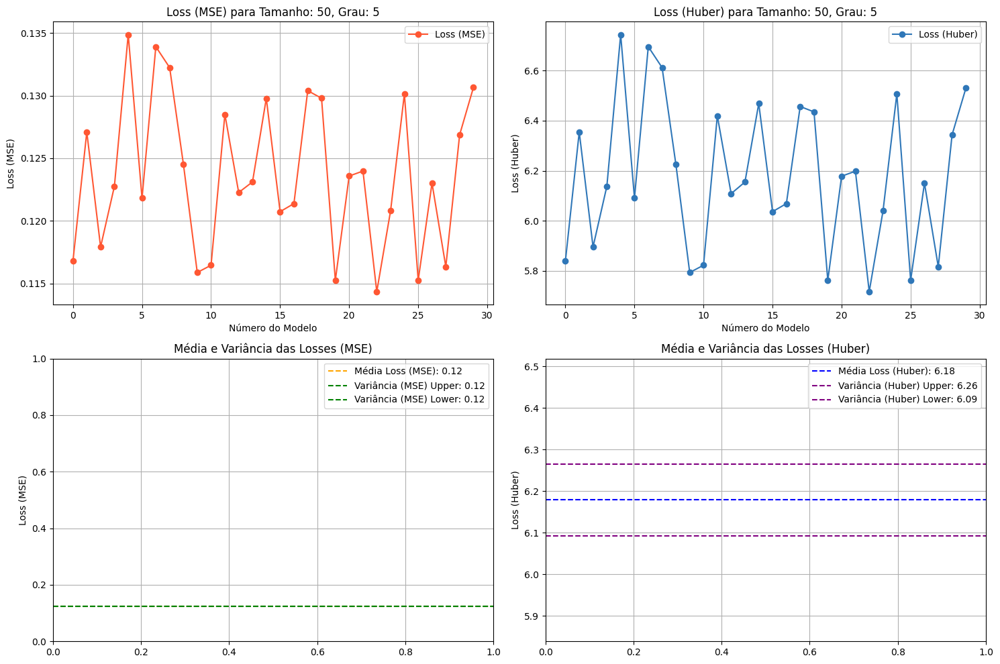

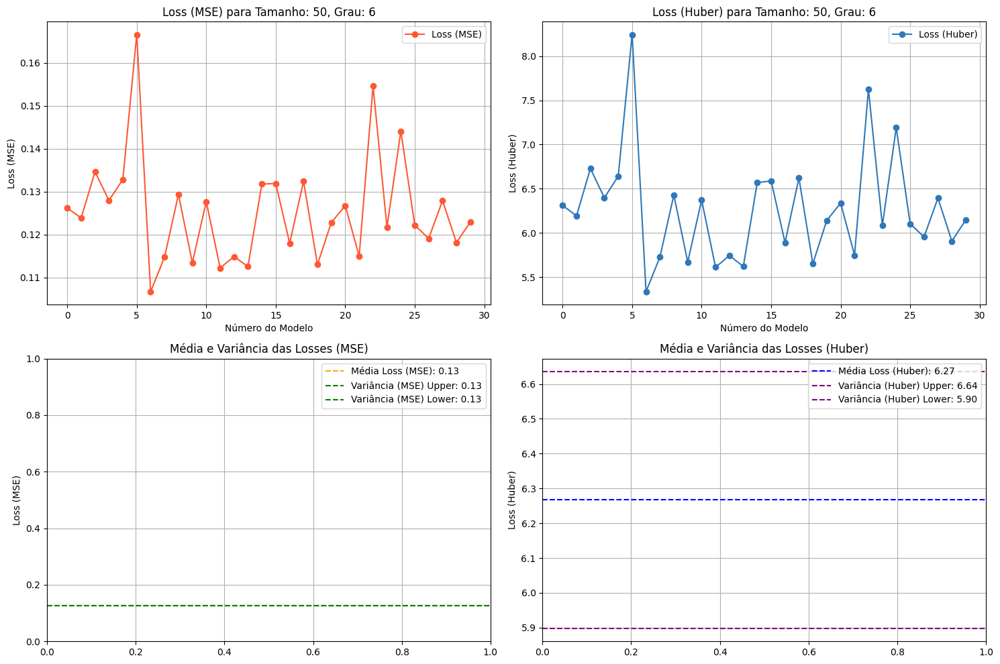

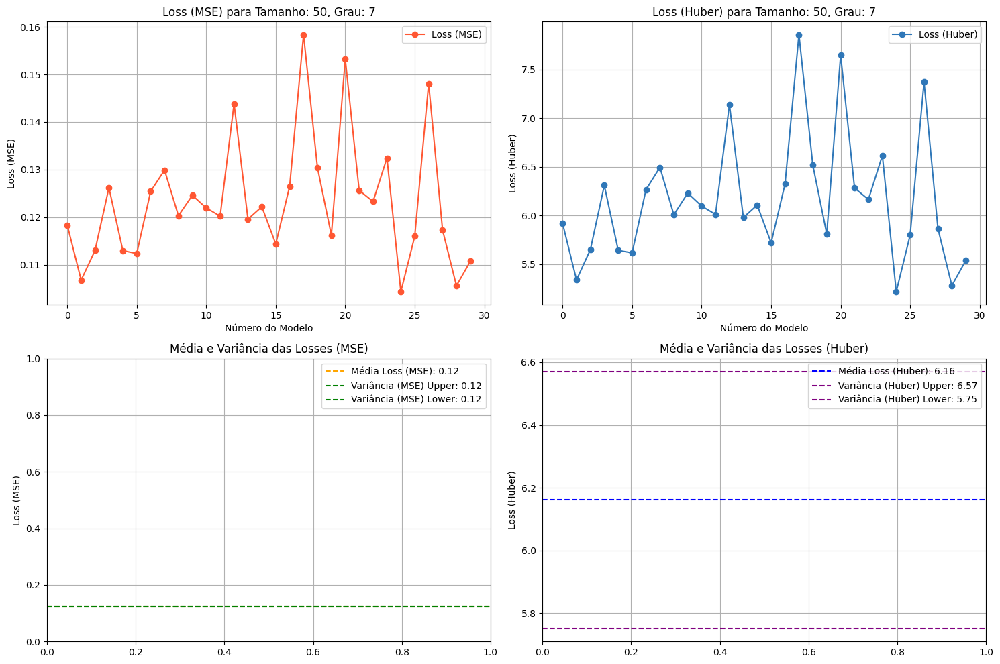

In [ ]:
tamanhos = [10, 30, 50]
graus = [2, 3, 4, 5, 6, 7]
n_experiments = 30

# nesse trecho vou usar a função que criamos la em cima para validarmos a média da loss e da variância

for tam in tamanhos:
    for grau in graus:
        losses_huber = []
        losses_mse = []

        for i in range(n_experiments):
            x_train, y_train = generate_dataset(tam, True)

            _, _, huber_loss_value, mse_value = train_polynomial_model(x_train, y_train, x_test, y_test, grau)
            losses_huber.append(huber_loss_value)
            losses_mse.append(mse_value)

        graphics_exec_2(losses_huber, losses_mse, tam, grau)

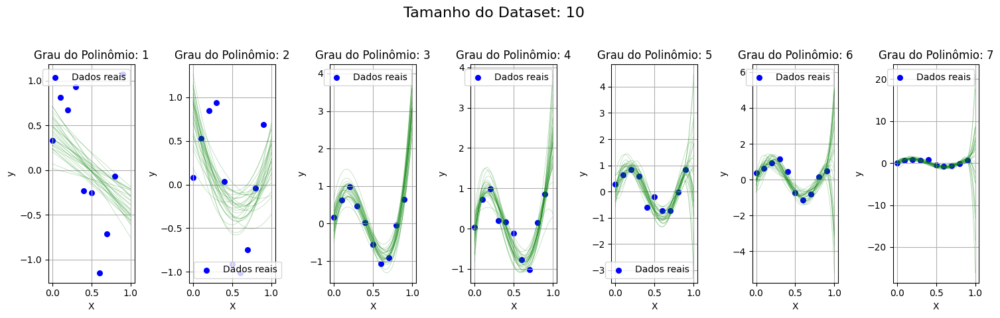

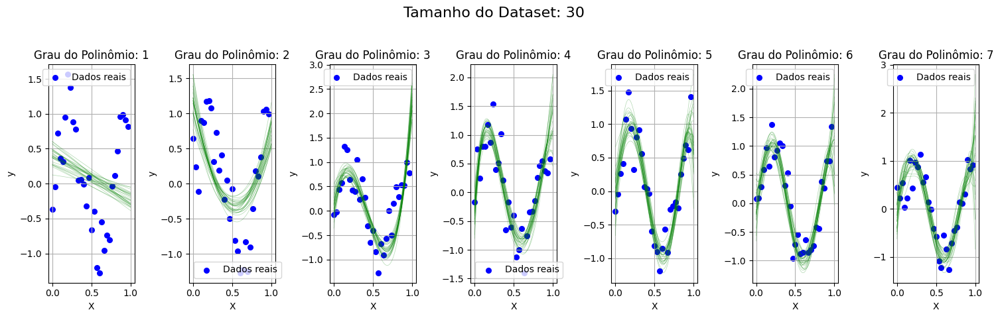

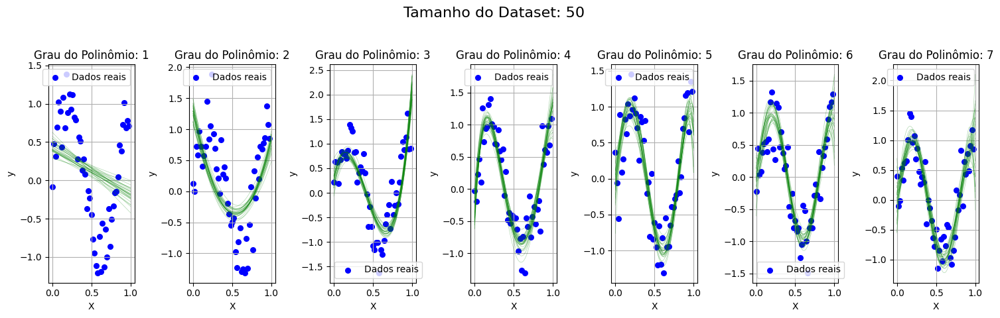

In [ ]:
def plot_loss_with_polynomial_curves(tamanhos, graus, n_experiments):
    x_plot = np.linspace(0, 1, 100).reshape(-1, 1)

    for tam in tamanhos:
        fig, axes = plt.subplots(1, len(graus), figsize=(15, 5))
        fig.suptitle(f'Tamanho do Dataset: {tam}', fontsize=16)
        for idx, grau in enumerate(graus):
            ax = axes[idx]
            ax.set_title(f'Grau do Polinômio: {grau}')
            ax.set_xlabel('X')
            ax.set_ylabel('y')
            for i in range(n_experiments):
                x_train, y_train = generate_dataset(tam, True)

                model, poly, huber_loss_value, mse_value = train_polynomial_model(x_train, y_train, x_test, y_test, grau)

                x_plot_poly = poly.transform(x_plot)
                y_plot = model.predict(x_plot_poly)

                ax.plot(x_plot, y_plot, color='green', alpha=0.3, linewidth=0.5)

                if i == 0:
                    ax.scatter(x_train, y_train, color='blue', label='Dados reais', s=30)

            ax.legend()
            ax.grid(True)

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

# params do experimento
tamanhos = [10, 30, 50]  # size dos datas
graus = range(1, 8)  # graus do polinômio de 1 até 7
n_experiments = 30

plot_loss_with_polynomial_curves(tamanhos, graus, n_experiments)

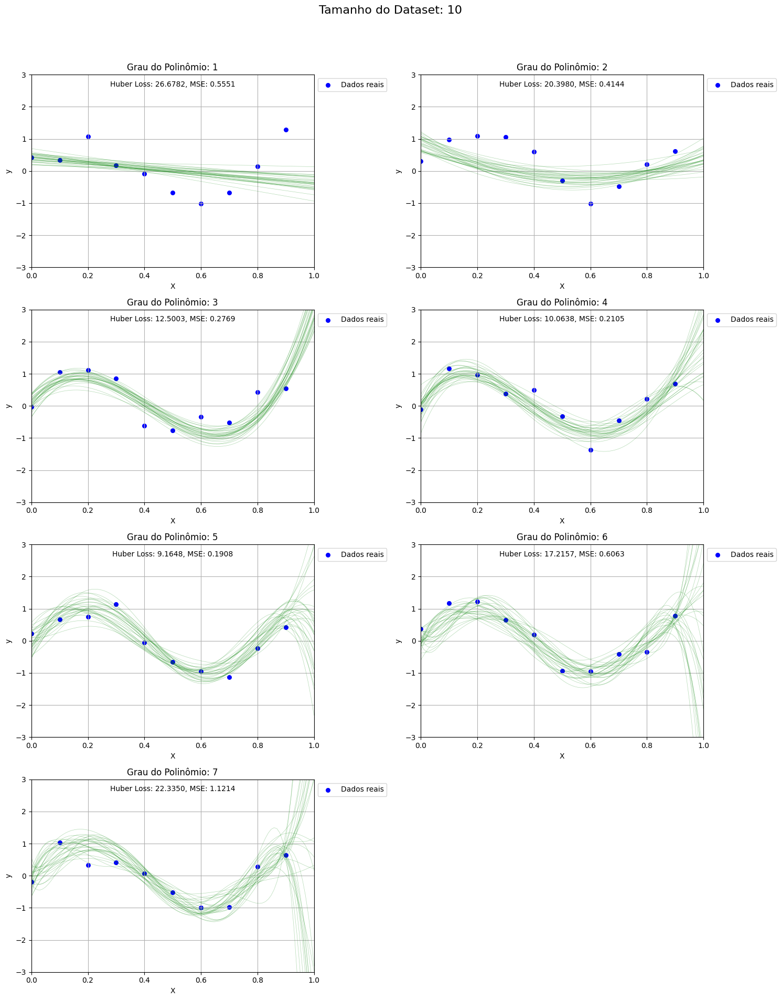

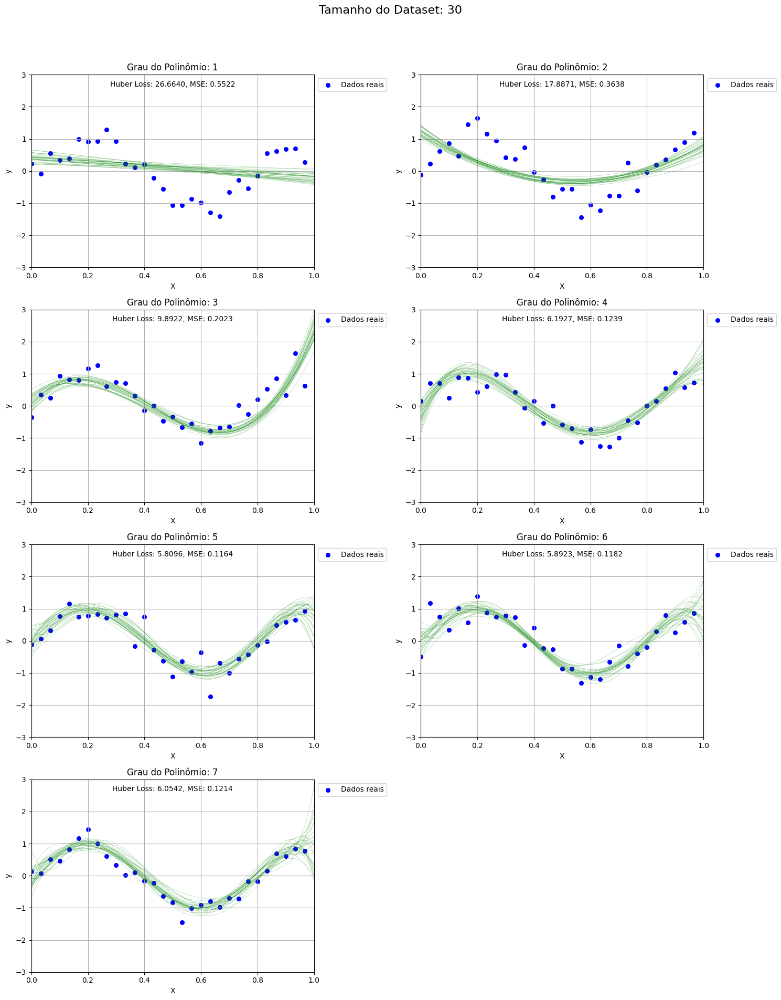

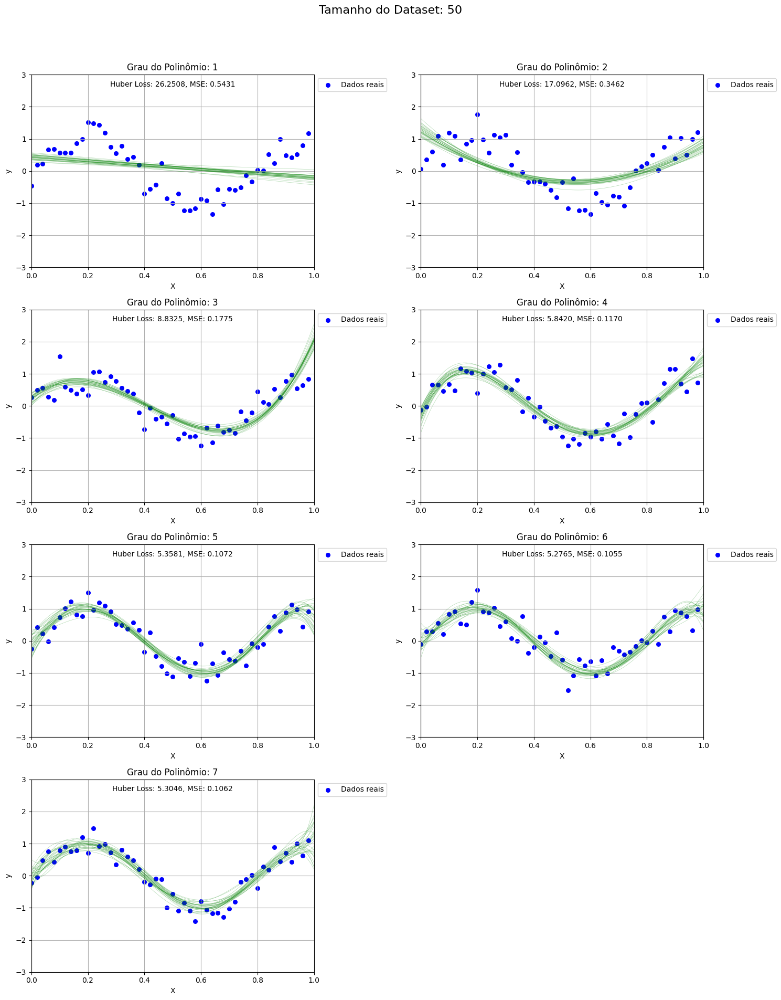

In [ ]:
def plot_loss_with_polynomial_curves(tamanhos, graus, n_experiments):
    x_plot = np.linspace(0, 1, 100).reshape(-1, 1)

    num_graus = len(graus)
    num_rows = (num_graus + 1) // 2

    for tam in tamanhos:
        fig, axes = plt.subplots(num_rows, 2, figsize=(15, 5 * num_rows))
        axes = axes.flatten()
        fig.suptitle(f'Tamanho do Dataset: {tam}', fontsize=16)

        for idx, grau in enumerate(graus):
            ax = axes[idx]
            ax.set_title(f'Grau do Polinômio: {grau}')
            ax.set_xlabel('X')
            ax.set_ylabel('y')
            ax.set_xlim(0, 1)
            ax.set_ylim(-3, 3)

            huber_losses = []
            mse_losses = []

            for i in range(n_experiments):
                x_train, y_train = generate_dataset(tam, True)
                x_test, y_test = generate_dataset(100, False)

                model, poly, huber_loss_value, mse_value = train_polynomial_model(x_train, y_train, x_test, y_test, grau)

                x_plot_poly = poly.transform(x_plot)
                y_plot = model.predict(x_plot_poly)

                huber_losses.append(huber_loss_value)
                mse_losses.append(mse_value)

                ax.plot(x_plot, y_plot, color='green', alpha=0.3, linewidth=0.5)

                if i == 0:
                    ax.scatter(x_train, y_train, color='blue', label='Dados reais', s=30)

            ax.legend(loc='upper left', bbox_to_anchor=(1, 1))
            ax.grid(True)

            ax.text(0.5, 0.95, f'Huber Loss: {np.mean(huber_losses):.4f}, MSE: {np.mean(mse_losses):.4f}',
                    horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)

        for j in range(num_graus, len(axes)):
            fig.delaxes(axes[j])

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()




# params do experimento
tamanhos = [10, 30, 50]  # size dos datas
graus = range(1, 8)  # graus do polinômio de 1 até 7
n_experiments = 30

plot_loss_with_polynomial_curves(tamanhos, graus, n_experiments)

In [ ]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score

# nessa função vou add a métrica de R2
def train_polynomial_model_r2(x_train, y_train, x_test, y_test, degree, delta=1.0):
    poly = PolynomialFeatures(degree=degree)
    x_poly_train = poly.fit_transform(x_train)
    x_poly_test = poly.transform(x_test)

    model = LinearRegression()
    model.fit(x_poly_train, y_train)

    y_pred = model.predict(x_poly_test)

    huber_loss_value = huber_loss(y_test, y_pred, delta)
    mse_value = mean_squared_error(y_test, y_pred)
    mae_value = mean_absolute_error(y_test, y_pred)
    r2_value = r2_score(y_test, y_pred)

    return model, poly, huber_loss_value, mse_value, mae_value, r2_value

def plot_loss_with_polynomial_curves(tamanhos, graus, n_experiments):
    x_plot = np.linspace(0, 1, 100).reshape(-1, 1)

    for tam in tamanhos:
        print(f'Tamanho do Dataset: {tam}')

        best_mae = float('inf')
        best_mae_degree = None
        best_r2 = -np.inf
        best_r2_degree = None

        for grau in graus:
            mae_values = []
            r2_values = []

            for i in range(n_experiments):
                x_train, y_train = generate_dataset(tam, True)

                model, poly, huber_loss_value, mse_value, mae_value, r2_value = train_polynomial_model_r2(x_train, y_train, x_test, y_test, grau)

                mae_values.append(mae_value)
                r2_values.append(r2_value)

            avg_mae = np.mean(mae_values)
            avg_r2 = np.mean(r2_values)

            if avg_mae < best_mae:
                best_mae = avg_mae
                best_mae_degree = grau

            if avg_r2 > best_r2:
                best_r2 = avg_r2
                best_r2_degree = grau

            print(f'Grau do Polinômio: {grau}, MAE: {avg_mae:.4f}, R²: {avg_r2:.4f}')

        print(f'Melhor Grau com base na MAE: {best_mae_degree} (MAE: {best_mae:.4f})')
        print(f'Melhor Grau com base no R²: {best_r2_degree} (R²: {best_r2:.4f})')

# params do experimento
tamanhos = [10, 30, 50]  # size dos datas
graus = range(1, 8)  # graus do polinômio de 1 até 7
n_experiments = 30

plot_loss_with_polynomial_curves(tamanhos, graus, n_experiments)


Tamanho do Dataset: 10
Grau do Polinômio: 1, MAE: 0.6911, R²: 0.0205
Grau do Polinômio: 2, MAE: 0.5963, R²: 0.2698
Grau do Polinômio: 3, MAE: 0.3930, R²: 0.6305
Grau do Polinômio: 4, MAE: 0.3470, R²: 0.7008
Grau do Polinômio: 5, MAE: 0.3522, R²: 0.6502
Grau do Polinômio: 6, MAE: 0.4544, R²: 0.1226
Grau do Polinômio: 7, MAE: 0.5429, R²: -1.2512
Melhor Grau com base na MAE: 4 (MAE: 0.3470)
Melhor Grau com base no R²: 4 (R²: 0.7008)
Tamanho do Dataset: 30
Grau do Polinômio: 1, MAE: 0.6901, R²: 0.0389
Grau do Polinômio: 2, MAE: 0.5629, R²: 0.3434
Grau do Polinômio: 3, MAE: 0.3717, R²: 0.7121
Grau do Polinômio: 4, MAE: 0.2898, R²: 0.8251
Grau do Polinômio: 5, MAE: 0.2832, R²: 0.8271
Grau do Polinômio: 6, MAE: 0.2866, R²: 0.8202
Grau do Polinômio: 7, MAE: 0.2917, R²: 0.8122
Melhor Grau com base na MAE: 5 (MAE: 0.2832)
Melhor Grau com base no R²: 5 (R²: 0.8271)
Tamanho do Dataset: 50
Grau do Polinômio: 1, MAE: 0.6913, R²: 0.0391
Grau do Polinômio: 2, MAE: 0.5536, R²: 0.3585
Grau do Polinômio:

In [ ]:
from sklearn.metrics import r2_score
def plot_loss_with_polynomial_curves(tamanhos, graus, n_experiments):
    x_plot = np.linspace(0, 1, 100).reshape(-1, 1)
    best_degrees = {}

    for tam in tamanhos:
        best_r2 = -np.inf
        best_degree = None

        for grau in graus:
            mean_r2 = []

            for i in range(n_experiments):
                x_train, y_train = generate_dataset(tam, True)

                model, poly, huber_loss_value, mse_value, mae_value, r2_value = train_polynomial_model_r2(x_train, y_train, x_test, y_test, grau)

                mean_r2.append(r2_value)

            avg_r2 = np.mean(mean_r2)

            if avg_r2 > best_r2:
                best_r2 = avg_r2
                best_degree = grau

        best_degrees[tam] = best_degree
        print(f'Tamanho do Dataset: {tam}, Melhor Grau do Polinômio: {best_degree}, R²: {best_r2:.4f}')

# params do experimento
tamanhos = [10, 30, 50]  # size dos datas
graus = range(1, 8)  # graus do polinômio de 1 até 7
n_experiments = 30

plot_loss_with_polynomial_curves(tamanhos, graus, n_experiments)


Tamanho do Dataset: 10, Melhor Grau do Polinômio: 4, R²: 0.7189
Tamanho do Dataset: 30, Melhor Grau do Polinômio: 4, R²: 0.8328
Tamanho do Dataset: 50, Melhor Grau do Polinômio: 6, R²: 0.8442


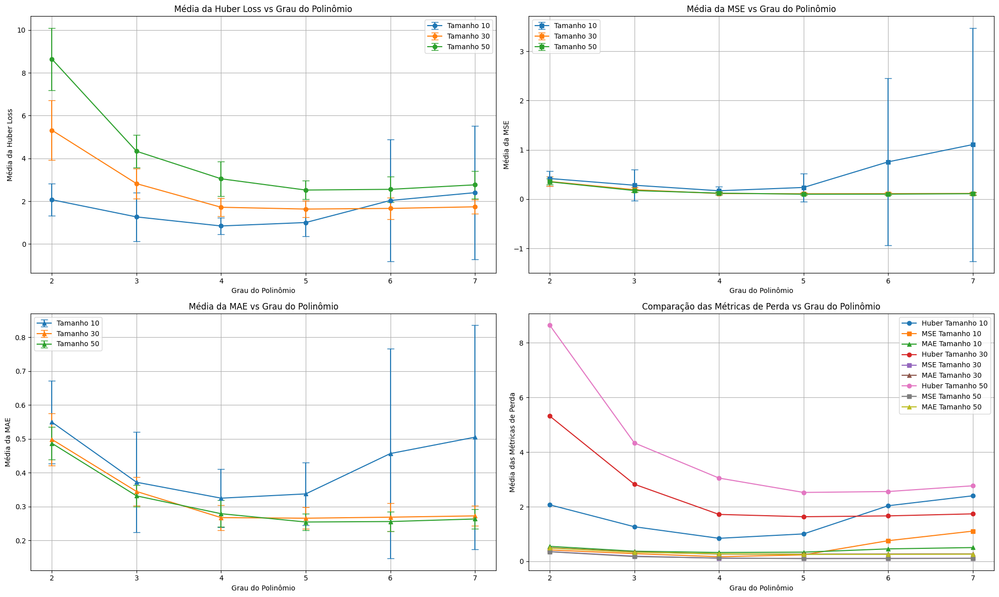

Média da MAE para cada tamanho de dataset e grau do polinômio:
Tamanho: 10, Grau: 2, Média da MAE: 0.5495
Tamanho: 10, Grau: 3, Média da MAE: 0.3720
Tamanho: 10, Grau: 4, Média da MAE: 0.3249
Tamanho: 10, Grau: 5, Média da MAE: 0.3375
Tamanho: 10, Grau: 6, Média da MAE: 0.4568
Tamanho: 10, Grau: 7, Média da MAE: 0.5051
Tamanho: 30, Grau: 2, Média da MAE: 0.4986
Tamanho: 30, Grau: 3, Média da MAE: 0.3448
Tamanho: 30, Grau: 4, Média da MAE: 0.2674
Tamanho: 30, Grau: 5, Média da MAE: 0.2657
Tamanho: 30, Grau: 6, Média da MAE: 0.2688
Tamanho: 30, Grau: 7, Média da MAE: 0.2726
Tamanho: 50, Grau: 2, Média da MAE: 0.4870
Tamanho: 50, Grau: 3, Média da MAE: 0.3317
Tamanho: 50, Grau: 4, Média da MAE: 0.2790
Tamanho: 50, Grau: 5, Média da MAE: 0.2545
Tamanho: 50, Grau: 6, Média da MAE: 0.2558
Tamanho: 50, Grau: 7, Média da MAE: 0.2634


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

def train_polynomial_model(x_train, y_train, x_test, y_test, degree, delta=1.0):
    poly = PolynomialFeatures(degree=degree)
    x_poly_train = poly.fit_transform(x_train)
    x_poly_test = poly.transform(x_test)

    model = LinearRegression()
    model.fit(x_poly_train, y_train)

    y_pred = model.predict(x_poly_test)

    huber_loss_value = huber_loss(y_test, y_pred, delta)
    mse_value = mean_squared_error(y_test, y_pred)
    mae_value = mean_absolute_error(y_test, y_pred)

    return model, poly, huber_loss_value, mse_value, mae_value

tamanhos = [10, 30, 50]
graus = list(range(2, 8))
n_experiments = 30

mean_huber = {tam: [] for tam in tamanhos}
std_huber = {tam: [] for tam in tamanhos}
mean_mse = {tam: [] for tam in tamanhos}
std_mse = {tam: [] for tam in tamanhos}
mean_mae = {tam: [] for tam in tamanhos}
std_mae = {tam: [] for tam in tamanhos}

for tam in tamanhos:
    for grau in graus:
        losses_huber = []
        losses_mse = []
        losses_mae = []

        for i in range(n_experiments):
            x_train, y_train = generate_dataset(tam, True)
            x_test, y_test = generate_dataset(tam, False)

            _, _, huber_loss_value, mse_value, mae_value = train_polynomial_model(x_train, y_train, x_test, y_test, grau)

            losses_huber.append(huber_loss_value)
            losses_mse.append(mse_value)
            losses_mae.append(mae_value)

        media_huber = np.mean(losses_huber)
        desvio_huber = np.std(losses_huber)
        media_mse = np.mean(losses_mse)
        desvio_mse = np.std(losses_mse)
        media_mae = np.mean(losses_mae)
        desvio_mae = np.std(losses_mae)

        mean_huber[tam].append(media_huber)
        std_huber[tam].append(desvio_huber)
        mean_mse[tam].append(media_mse)
        std_mse[tam].append(desvio_mse)
        mean_mae[tam].append(media_mae)
        std_mae[tam].append(desvio_mae)

def plot_loss_metrics(tamanhos, graus, mean_huber, std_huber, mean_mse, std_mse, mean_mae, std_mae):
    fig, axs = plt.subplots(2, 2, figsize=(20, 12))

    # grafico 1: media da Huber Loss vs grau do Polinômio
    for tam in tamanhos:
        axs[0, 0].errorbar(graus, mean_huber[tam], yerr=std_huber[tam], marker='o', label=f'Tamanho {tam}', capsize=5)
    axs[0, 0].set_title('Média da Huber Loss vs Grau do Polinômio')
    axs[0, 0].set_xlabel('Grau do Polinômio')
    axs[0, 0].set_ylabel('Média da Huber Loss')
    axs[0, 0].legend()
    axs[0, 0].grid(True)

    # grafico 2: media da MSE x grau do Polinômio
    for tam in tamanhos:
        axs[0, 1].errorbar(graus, mean_mse[tam], yerr=std_mse[tam], marker='s', label=f'Tamanho {tam}', capsize=5)
    axs[0, 1].set_title('Média da MSE vs Grau do Polinômio')
    axs[0, 1].set_xlabel('Grau do Polinômio')
    axs[0, 1].set_ylabel('Média da MSE')
    axs[0, 1].legend()
    axs[0, 1].grid(True)

    # grafico 3: média da MAE x grau do Polinômio
    for tam in tamanhos:
        axs[1, 0].errorbar(graus, mean_mae[tam], yerr=std_mae[tam], marker='^', label=f'Tamanho {tam}', capsize=5)
    axs[1, 0].set_title('Média da MAE vs Grau do Polinômio')
    axs[1, 0].set_xlabel('Grau do Polinômio')
    axs[1, 0].set_ylabel('Média da MAE')
    axs[1, 0].legend()
    axs[1, 0].grid(True)

    # grfico 4: métricas de Perda
    for tam in tamanhos:
        axs[1, 1].plot(graus, mean_huber[tam], marker='o', label=f'Huber Tamanho {tam}')
        axs[1, 1].plot(graus, mean_mse[tam], marker='s', label=f'MSE Tamanho {tam}')
        axs[1, 1].plot(graus, mean_mae[tam], marker='^', label=f'MAE Tamanho {tam}')
    axs[1, 1].set_title('Comparação das Métricas de Perda vs Grau do Polinômio')
    axs[1, 1].set_xlabel('Grau do Polinômio')
    axs[1, 1].set_ylabel('Média das Métricas de Perda')
    axs[1, 1].legend()
    axs[1, 1].grid(True)

    plt.tight_layout()
    plt.show()

plot_loss_metrics(tamanhos, graus, mean_huber, std_huber, mean_mse, std_mse, mean_mae, std_mae)
print("Média da MAE para cada tamanho de dataset e grau do polinômio:")
for tam in tamanhos:
    for grau in graus:
        print(f"Tamanho: {tam}, Grau: {grau}, Média da MAE: {mean_mae[tam][grau - 2]:.4f}")

### Análise da Escolha do Grau de Polinômio

Para cada tamanho de dataset, utilizei alguns gráficos para analisar as médias e variâncias das perdas, tanto do MSE quanto da Huber Loss. Essa análise me permitiu observar o comportamento dos modelos em relação aos dados reais.

Além disso, calculei a **Média do Erro Absoluto (MAE)** para cada grau de polinômio em cada dataset, que foi uma métrica escolhida para avaliar a precisão das previsões do modelo.

### Resultados

os resultados revelaram as seguintes médias de MAE para cada tamanho de dataset:

- **Tamanho 10:** O polinômio de grau 4 apresentou uma MAE de **0.3249**.
- **Tamanho 30:** O grau 5 teve a menor MAE, com um valor de **0.2657**.
- **Tamanho 50:** Novamente, o grau 5 se destacou, com uma MAE de **0.2545**.

### Conclusão

Com base nos resultados obtidos, concluo que, o melhor grau de polinômio para cada tamanho de dataset é:

- **Tamanho 10:** Grau 4 (MAE = 0.3249)
- **Tamanho 30:** Grau 5 (MAE = 0.2657)
- **Tamanho 50:** Grau 5 (MAE = 0.2545)

Essas escolhas são fundamentadas na análise das perdas e na precisão das previsões, indicando que esses graus de polinômio otimizam o desempenho do modelo em relação aos dados disponíveis


## **Alternativa B**

In [12]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

def train_polynomial_model_r2(x_train, y_train, x_test, y_test, degree, delta=1.0):
    poly = PolynomialFeatures(degree=degree)
    x_poly_train = poly.fit_transform(x_train)
    x_poly_test = poly.transform(x_test)

    model = LinearRegression()
    model.fit(x_poly_train, y_train)

    y_pred = model.predict(x_poly_test)

    huber_loss_value = huber_loss(y_test, y_pred, delta)
    mse_value = mean_squared_error(y_test, y_pred)
    mae_value = mean_absolute_error(y_test, y_pred)
    r2_value = r2_score(y_test, y_pred)

    return model, poly, huber_loss_value, mse_value, mae_value, r2_value

def loss(y_true, y_pred):
    return np.mean((y_true - y_pred)**2)

def huber_loss(y_true, y_pred, delta=1.0):
    error = y_true - y_pred
    is_small_error = np.abs(error) <= delta
    squared_loss = 0.5 * error**2
    linear_loss = delta * (np.abs(error) - 0.5 * delta)
    return np.where(is_small_error, squared_loss, linear_loss).sum()

In [73]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

sizes = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]
n_experiments = 30
degrees = [2, 3, 4, 5, 6, 7]
test_size = 100

In [78]:
data = []

In [79]:
for tam in sizes:
    for i in range(n_experiments):
        x_train, y_train = generate_dataset(tam, True)

        model_lin = LinearRegression()
        model_lin.fit(x_train, y_train)
        y_pred_lin = model_lin.predict(x_test)
        loss_lin = loss(y_test, y_pred_lin)
        mse_lin = mean_squared_error(y_test, y_pred_lin)
        mae_lin = mean_absolute_error(y_test, y_pred_lin)
        r2_lin = r2_score(y_test, y_pred_lin)
        coefs_lin = model_lin.coef_
        intercept_lin = model_lin.intercept_

        data.append({
            'Model': 'Linear',
            'Degree': 1,
            'Size': tam,
            'Experiment': i+1,
            'Loss': loss_lin,
            'MSE': mse_lin,
            'MAE': mae_lin,
            'R2': r2_lin,
            'Huber Loss': np.nan,
            'Coefficients': coefs_lin,
            'Intercept': intercept_lin
        })

        for degree in degrees:
            model_poly, poly, huber_loss_value, mse_value, mae_value, r2_value = train_polynomial_model_r2(
                x_train, y_train, x_test, y_test, degree)
            y_pred_poly = model_poly.predict(poly.transform(x_test))
            coefs_poly = model_poly.coef_
            intercept_poly = model_poly.intercept_

            data.append({
                'Model': 'Polynomial',
                'Degree': degree,
                'Size': tam,
                'Experiment': i+1,
                'Loss': loss(y_test, y_pred_poly),
                'MSE': mse_value,
                'MAE': mae_value,
                'R2': r2_value,
                'Huber Loss': huber_loss_value,
                'Coefficients': coefs_poly,
                'Intercept': intercept_poly
            })

In [80]:
df = pd.DataFrame(data)
df

,Model,Degree,Size,Experiment,Loss,MSE,MAE,R2,Huber Loss,Coefficients,Intercept
0,Linear,1,5,1,0.701121,0.701121,0.659952,-0.449914,NaN,[-1.7565170960440262],0.828690
1,Polynomial,2,5,1,0.491957,0.491957,0.588006,-0.017365,23.847624,"[0.0, -3.8765661187769735, 2.6500612784161843]",1.040695
2,Polynomial,3,5,1,1.464817,1.464817,0.700537,-2.029234,40.804417,"[0.0, 13.170327716548561, -56.81584744946356, ...",0.564967
3,Polynomial,4,5,1,7.663065,7.663065,1.312677,-14.847181,100.072893,"[0.0, 0.23876914917571945, 31.76532873704005, ...",0.627039
4,Polynomial,5,5,1,10.144477,10.144477,1.469455,-19.978728,115.410625,"[7.627232179174825e-14, 2.52008127344142, 8.00...",0.627039
...,...,...,...,...,...,...,...,...,...,...,...
2095,Polynomial,3,50,30,0.159206,0.159206,0.320758,0.670763,7.955671,"[0.0, 6.798307308477399, -28.581624222387365, ...",0.409706
2096,Polynomial,4,50,30,0.085212,0.085212,0.232948,0.823781,4.260622,"[0.0, 20.448060586387598, -92.74455091435942, ...",-0.198241
2097,Polynomial,5,50,30,0.074490,0.074490,0.217510,0.845956,3.724488,"[0.0, 11.842726428910549, -28.786529355520955,...",0.043335
2098,Polynomial,6,50,30,0.075892,0.075892,0.220712,0.843055,3.794607,"[0.0, 8.030321367728328, 12.46964548612032, -2...",0.114586


In [82]:
r2_means = df.groupby(['Model', 'Degree', 'Size'])['R2'].mean().reset_index()
r2_means

,Model,Degree,Size,R2
0,Linear,1,5,-0.311618
1,Linear,1,10,-0.123325
2,Linear,1,15,-0.053472
3,Linear,1,20,-0.042138
4,Linear,1,25,-0.045166
...,...,...,...,...
65,Polynomial,7,30,0.797121
66,Polynomial,7,35,0.798222
67,Polynomial,7,40,0.812686
68,Polynomial,7,45,0.802135


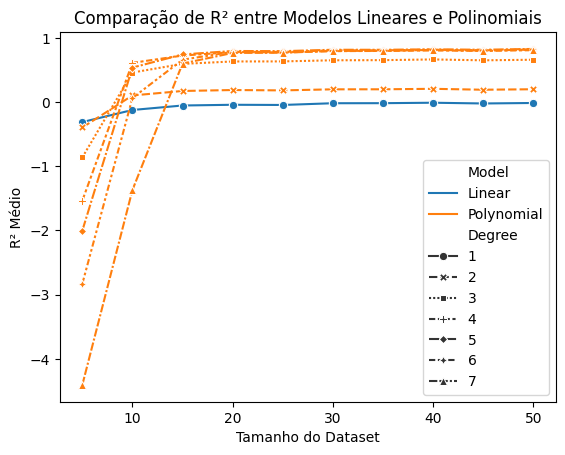

In [83]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.lineplot(data=r2_means, x='Size', y='R2', hue='Model', style='Degree', markers=True)
plt.title('Comparação de R² entre Modelos Lineares e Polinomiais')
plt.xlabel('Tamanho do Dataset')
plt.ylabel('R² Médio')
plt.show()

In [86]:
mae_stats = df.groupby(['Model', 'Degree', 'Size'])['MAE'].agg(['mean', 'std']).reset_index()

In [88]:
mae_stats

,Model,Degree,Size,mean,std
0,Linear,1,5,0.659236,0.048878
1,Linear,1,10,0.619363,0.027404
2,Linear,1,15,0.605635,0.015441
3,Linear,1,20,0.601751,0.014526
4,Linear,1,25,0.602727,0.016564
...,...,...,...,...,...
65,Polynomial,7,30,0.250127,0.016075
66,Polynomial,7,35,0.248216,0.017892
67,Polynomial,7,40,0.241547,0.013243
68,Polynomial,7,45,0.248879,0.019223


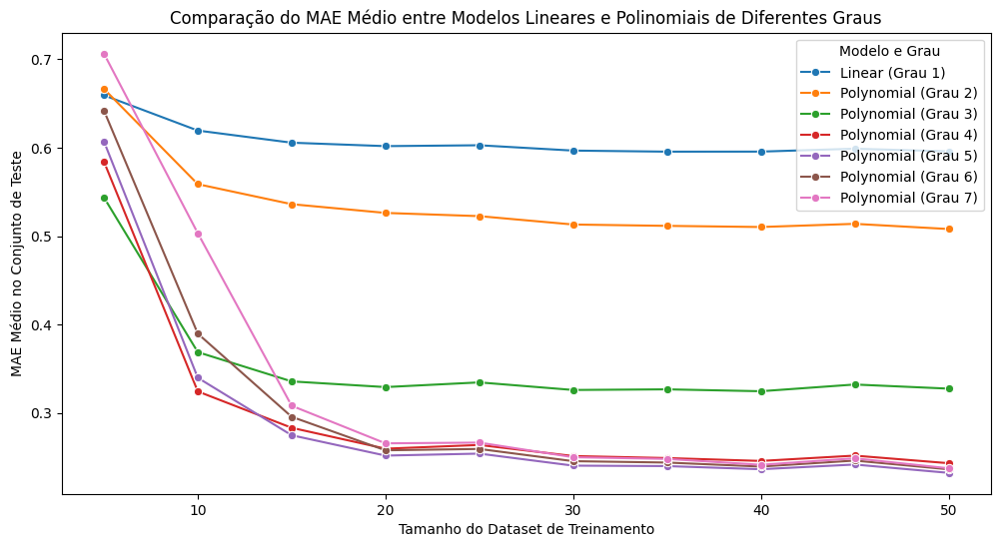

In [90]:
plot_data = mae_stats[(mae_stats['Model'] == 'Linear') | (mae_stats['Model'] == 'Polynomial')]

plot_data['Model_Degree'] = plot_data.apply(
    lambda row: f"{row['Model']} (Grau {int(row['Degree'])})", axis=1)

plt.figure(figsize=(12, 6))
sns.lineplot(data=plot_data, x='Size', y='mean', hue='Model_Degree', marker='o')
plt.title('Comparação do MAE Médio entre Modelos Lineares e Polinomiais de Diferentes Graus')
plt.xlabel('Tamanho do Dataset de Treinamento')
plt.ylabel('MAE Médio no Conjunto de Teste')
plt.legend(title='Modelo e Grau')
plt.show()

In [91]:
metrics = ['Loss', 'MSE', 'MAE', 'R2', 'Huber Loss']
summary_df = df.groupby(['Model', 'Degree', 'Size'])[metrics].mean().reset_index()
summary_df

,Model,Degree,Size,Loss,MSE,MAE,R2,Huber Loss
0,Linear,1,5,0.634246,0.634246,0.659236,-0.311618,NaN
1,Linear,1,10,0.543195,0.543195,0.619363,-0.123325,NaN
2,Linear,1,15,0.509417,0.509417,0.605635,-0.053472,NaN
3,Linear,1,20,0.503936,0.503936,0.601751,-0.042138,NaN
4,Linear,1,25,0.505401,0.505401,0.602727,-0.045166,NaN
...,...,...,...,...,...,...,...,...
65,Polynomial,7,30,0.098104,0.098104,0.250127,0.797121,4.903639
66,Polynomial,7,35,0.097572,0.097572,0.248216,0.798222,4.877568
67,Polynomial,7,40,0.090578,0.090578,0.241547,0.812686,4.528880
68,Polynomial,7,45,0.095680,0.095680,0.248879,0.802135,4.783989


In [103]:
average_metrics = summary_df.groupby('Model')[metrics].mean().reset_index()
poly_metrics = summary_df[summary_df['Model'] == 'Polynomial'].copy()
poly_average = poly_metrics.groupby('Degree')[metrics].mean().reset_index()
poly_average['Model'] = 'Grau ' + poly_average['Degree'].astype(str)
poly_average = poly_average[['Model'] + metrics]
final_average_metrics = pd.concat([average_metrics[average_metrics['Model'] == 'Linear'], poly_average], ignore_index=True)

final_average_metrics

,Model,Loss,MSE,MAE,R2,Huber Loss
0,Linear,0.515362,0.515362,0.607117,-0.065765,NaN
1,Grau 2,0.423349,0.423349,0.536729,0.124517,20.429140
2,Grau 3,0.254505,0.254505,0.355019,0.473686,10.829061
3,Grau 4,0.224855,0.224855,0.295776,0.535001,8.168389
4,Grau 5,0.243749,0.243749,0.291972,0.495929,8.166863
5,Grau 6,0.313886,0.313886,0.305714,0.350886,9.262370
6,Grau 7,0.464921,0.464921,0.327677,0.038546,11.096936


## **Alternativa C**

Com base na análise dos gráficos, podemos concluir que o modelo polinomial de grau 5 é o melhor, pois oferece a menor média de erro (MAE) e o maior R², equilibrando precisão e complexidade, enquanto graus superiores demonstram que um aumento na complexidade do modelo não necessariamente resulta em melhorias na previsão.

## **Alternativa D**

In [104]:
data = []

for tam in sizes:
    for i in range(n_experiments):
        x_train, y_train = generate_dataset(tam, True)

        model_lin = LinearRegression()
        model_lin.fit(x_train, y_train)
        y_pred_lin = model_lin.predict(x_train)

        loss_lin = loss(y_train, y_pred_lin)
        mse_lin = mean_squared_error(y_train, y_pred_lin)
        mae_lin = mean_absolute_error(y_train, y_pred_lin)
        r2_lin = r2_score(y_train, y_pred_lin)

        data.append({
            'Model': 'Linear',
            'Degree': 1,
            'Size': tam,
            'Experiment': i + 1,
            'Loss': loss_lin,
            'MSE': mse_lin,
            'MAE': mae_lin,
            'R2': r2_lin,
        })

        for degree in degrees:
            model_poly = PolynomialFeatures(degree=degree)
            x_poly_train = model_poly.fit_transform(x_train)
            model = LinearRegression()
            model.fit(x_poly_train, y_train)
            y_pred_poly = model.predict(x_poly_train)

            mse_value = mean_squared_error(y_train, y_pred_poly)
            mae_value = mean_absolute_error(y_train, y_pred_poly)
            r2_value = r2_score(y_train, y_pred_poly)

            data.append({
                'Model': 'Polynomial',
                'Degree': degree,
                'Size': tam,
                'Experiment': i + 1,
                'Loss': loss(y_train, y_pred_poly),
                'MSE': mse_value,
                'MAE': mae_value,
                'R2': r2_value,
            })

for tam in sizes:
    for i in range(n_experiments):
        x_train, y_train = generate_dataset(tam, False)

        model_lin = LinearRegression()
        model_lin.fit(x_train, y_train)
        y_pred_lin = model_lin.predict(x_train)

        loss_lin = loss(y_train, y_pred_lin)
        mse_lin = mean_squared_error(y_train, y_pred_lin)
        mae_lin = mean_absolute_error(y_train, y_pred_lin)
        r2_lin = r2_score(y_train, y_pred_lin)

        data.append({
            'Model': 'Linear (Uncontrolled)',
            'Degree': 1,
            'Size': tam,
            'Experiment': i + 1,
            'Loss': loss_lin,
            'MSE': mse_lin,
            'MAE': mae_lin,
            'R2': r2_lin,
        })

        for degree in degrees:
            model_poly = PolynomialFeatures(degree=degree)
            x_poly_train = model_poly.fit_transform(x_train)
            model = LinearRegression()
            model.fit(x_poly_train, y_train)
            y_pred_poly = model.predict(x_poly_train)

            mse_value = mean_squared_error(y_train, y_pred_poly)
            mae_value = mean_absolute_error(y_train, y_pred_poly)
            r2_value = r2_score(y_train, y_pred_poly)

            data.append({
                'Model': f'Polynomial (Uncontrolled) - Grau {degree}',
                'Degree': degree,
                'Size': tam,
                'Experiment': i + 1,
                'Loss': loss(y_train, y_pred_poly),
                'MSE': mse_value,
                'MAE': mae_value,
                'R2': r2_value,
            })

df_results = pd.DataFrame(data)

average_metrics = df_results.groupby(['Model', 'Degree']).mean().reset_index()
print(average_metrics)

                                 Model  Degree  Size  Experiment      Loss  \
0                               Linear       1  27.5        15.5  0.498054   
1                Linear (Uncontrolled)       1  27.5        15.5  0.486130   
2                           Polynomial       2  27.5        15.5  0.371309   
3                           Polynomial       3  27.5        15.5  0.121823   
4                           Polynomial       4  27.5        15.5  0.079535   
5                           Polynomial       5  27.5        15.5  0.061871   
6                           Polynomial       6  27.5        15.5  0.056980   
7                           Polynomial       7  27.5        15.5  0.053115   
8   Polynomial (Uncontrolled) - Grau 2       2  27.5        15.5  0.286386   
9   Polynomial (Uncontrolled) - Grau 3       3  27.5        15.5  0.122766   
10  Polynomial (Uncontrolled) - Grau 4       4  27.5        15.5  0.072430   
11  Polynomial (Uncontrolled) - Grau 5       5  27.5        15.5

In [105]:
average_metrics

,Model,Degree,Size,Experiment,Loss,MSE,MAE,R2
0,Linear,1,27.5,15.5,0.498054,0.498054,0.598234,0.091996
1,Linear (Uncontrolled),1,27.5,15.5,0.486130,0.486130,0.580810,0.114570
2,Polynomial,2,27.5,15.5,0.371309,0.371309,0.510402,0.317999
3,Polynomial,3,27.5,15.5,0.121823,0.121823,0.271895,0.778725
4,Polynomial,4,27.5,15.5,0.079535,0.079535,0.213611,0.856424
5,Polynomial,5,27.5,15.5,0.061871,0.061871,0.185990,0.888163
6,Polynomial,6,27.5,15.5,0.056980,0.056980,0.176741,0.896992
7,Polynomial,7,27.5,15.5,0.053115,0.053115,0.167999,0.904020
8,Polynomial (Uncontrolled) - Grau 2,2,27.5,15.5,0.286386,0.286386,0.431759,0.467983
9,Polynomial (Uncontrolled) - Grau 3,3,27.5,15.5,0.122766,0.122766,0.273911,0.770391


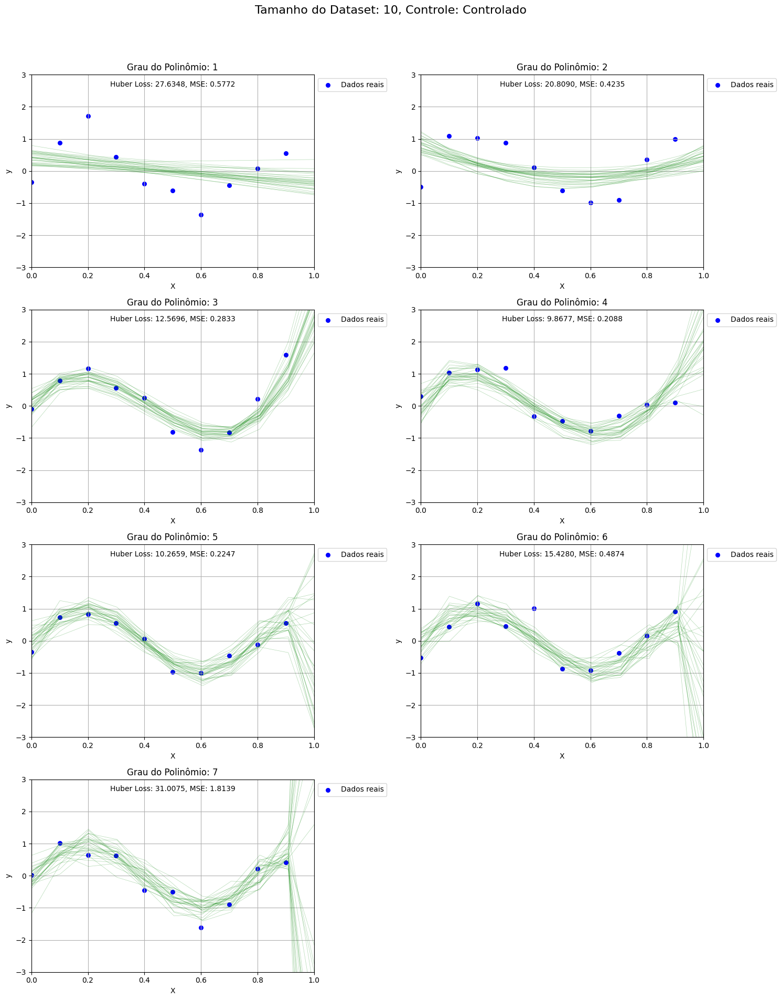

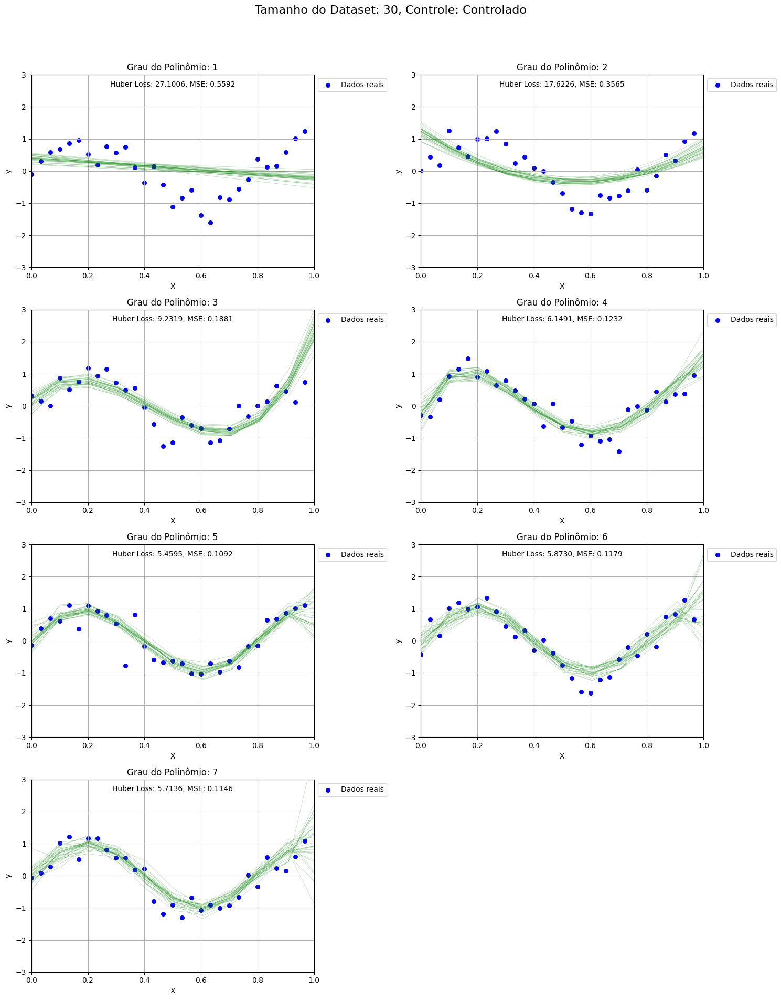

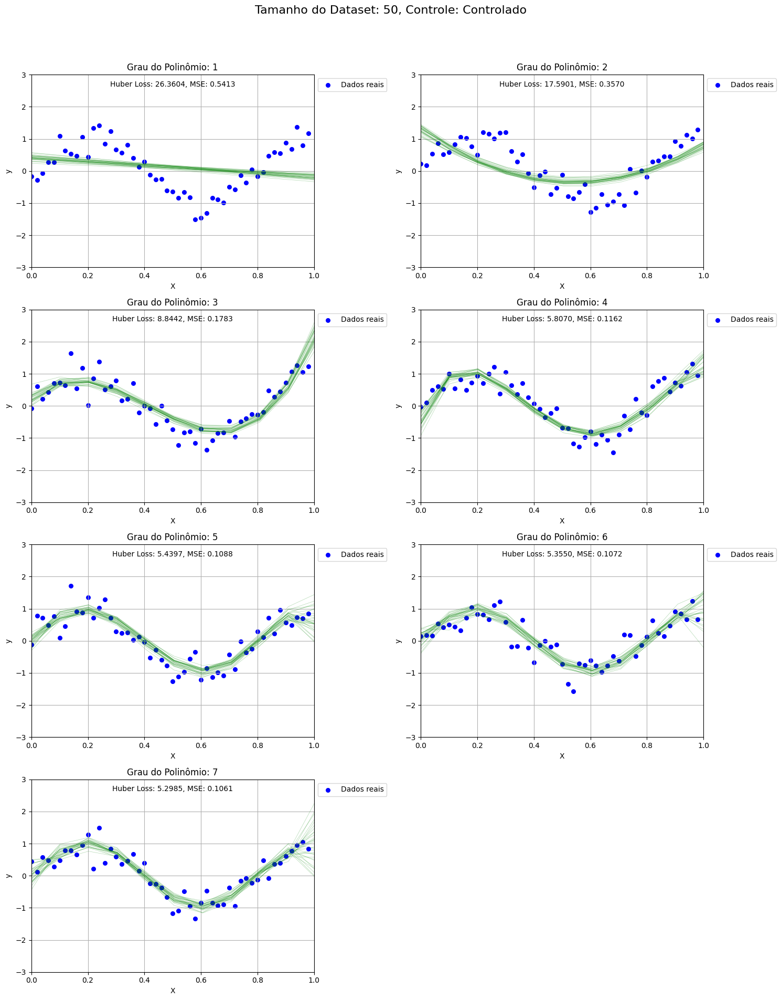

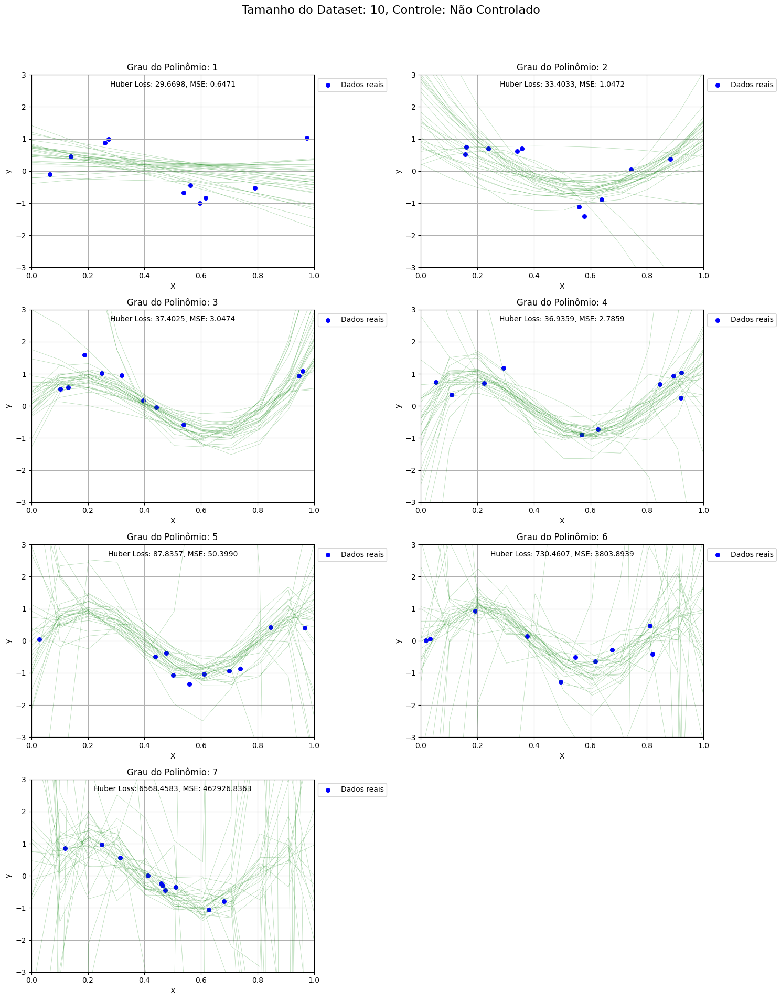

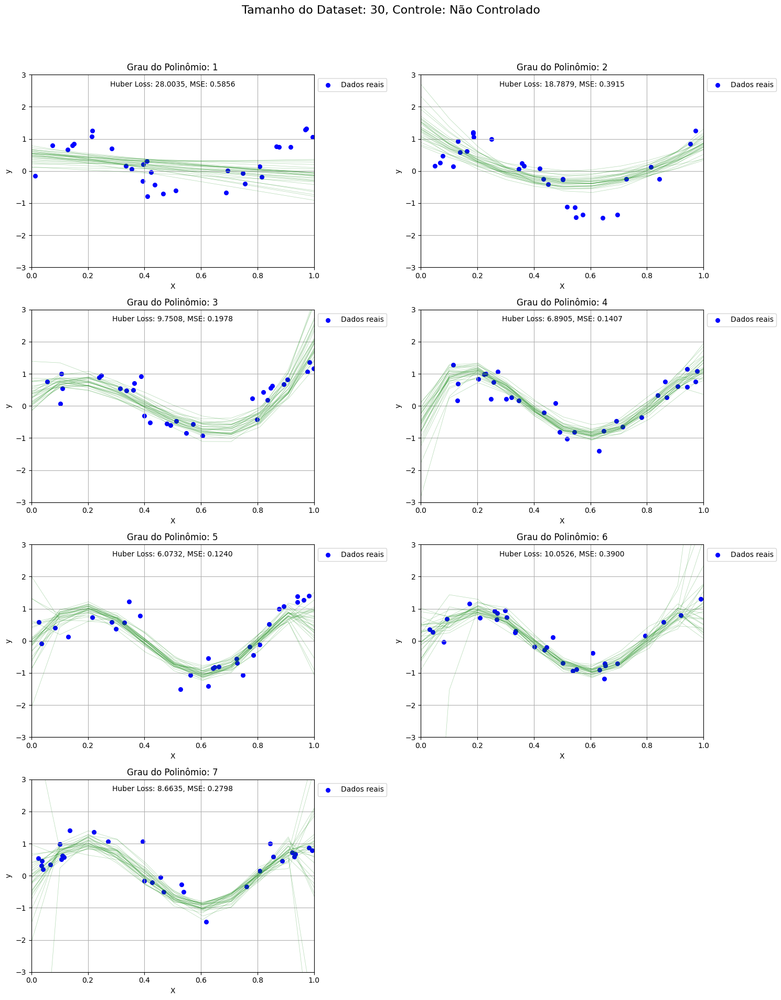

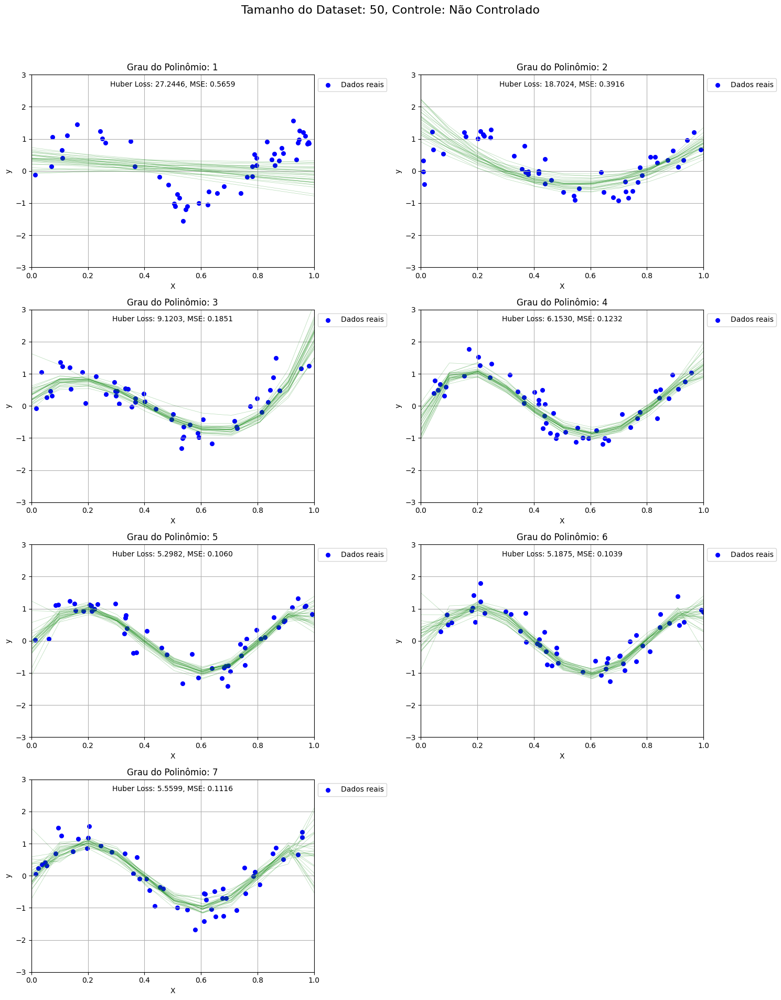

In [109]:
def train_polynomial_model(x_train, y_train, x_test, y_test, degree, delta=1.0):
    poly = PolynomialFeatures(degree=degree)
    x_poly_train = poly.fit_transform(x_train)

    model = LinearRegression()
    model.fit(x_poly_train, y_train)

    y_pred = model.predict(poly.transform(x_test))

    huber_loss_value = huber_loss(y_test, y_pred, delta)
    mse_value = mean_squared_error(y_test, y_pred)

    return model, poly, huber_loss_value, mse_value

def plot_loss_with_polynomial_curves(tamanhos, graus, n_experiments, controlled=True):
    x_plot = np.linspace(0, 10, 100).reshape(-1, 1)

    num_graus = len(graus)
    num_rows = (num_graus + 1) // 2

    for tam in tamanhos:
        fig, axes = plt.subplots(num_rows, 2, figsize=(15, 5 * num_rows))
        axes = axes.flatten()
        fig.suptitle(f'Tamanho do Dataset: {tam}, Controle: {"Controlado" if controlled else "Não Controlado"}', fontsize=16)

        for idx, grau in enumerate(graus):
            ax = axes[idx]
            ax.set_title(f'Grau do Polinômio: {grau}')
            ax.set_xlabel('X')
            ax.set_ylabel('y')
            ax.set_xlim(0, 1)
            ax.set_ylim(-3, 3)

            huber_losses = []
            mse_losses = []

            for i in range(n_experiments):
                x_train, y_train = generate_dataset(tam, controlled)
                x_test, y_test = generate_dataset(100, not controlled)

                model, poly, huber_loss_value, mse_value = train_polynomial_model(x_train, y_train, x_test, y_test, grau)

                x_plot_poly = poly.transform(x_plot)
                y_plot = model.predict(x_plot_poly)

                huber_losses.append(huber_loss_value)
                mse_losses.append(mse_value)

                ax.plot(x_plot, y_plot, color='green', alpha=0.3, linewidth=0.5)

                if i == 0:
                    ax.scatter(x_train, y_train, color='blue', label='Dados reais', s=30)

            ax.legend(loc='upper left', bbox_to_anchor=(1, 1))
            ax.grid(True)

            ax.text(0.5, 0.95, f'Huber Loss: {np.mean(huber_losses):.4f}, MSE: {np.mean(mse_losses):.4f}',
                    horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)

        for j in range(num_graus, len(axes)):
            fig.delaxes(axes[j])

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

tamanhos = [10, 30, 50]
graus = range(1, 8)
n_experiments = 30

plot_loss_with_polynomial_curves(tamanhos, graus, n_experiments, controlled=True)

plot_loss_with_polynomial_curves(tamanhos, graus, n_experiments, controlled=False)